In [2]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import timm
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import shutil

# Verify GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
print(f"GPU: {torch.cuda.get_device_name(0)}")
print(f"VRAM: {round(torch.cuda.get_device_properties(0).total_memory/1024**3, 1)} GB")



Using device: cuda
GPU: NVIDIA GeForce RTX 3060 Laptop GPU
VRAM: 6.0 GB


In [6]:
# Paths 
FF_BASE   = r"C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\FaceForensics\Dataset"
CELEB_BASE = r"D:\Aditi\DISSERTATION\Celeb-DF-v2\Celeb-DF-v2-upload"
OUT_BASE  = r"C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\data\frames"
MODELS_DIR = r"C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\models"
RESULTS_DIR = r"C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results"
# ============================================================

# Create folders
for folder in [MODELS_DIR, RESULTS_DIR,
               f'{RESULTS_DIR}/shap',
               f'{RESULTS_DIR}/lime',
               f'{RESULTS_DIR}/evaluation']:
    os.makedirs(folder, exist_ok=True)

print("Paths are configured")
print(f"  Frames will go to: {OUT_BASE}")
print(f"  Models will go to: {MODELS_DIR}")

Paths are configured
  Frames will go to: C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\data\frames
  Models will go to: C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\models


In [7]:
#Extract frames 

def extract_frames(video_folder, output_folder, num_frames=15, img_size=(299, 299)):
    os.makedirs(output_folder, exist_ok=True)
    if not os.path.exists(video_folder):
        print(f" Not found: {video_folder}")
        return 0
    videos = [f for f in os.listdir(video_folder)
              if f.endswith('.mp4')]
    if not videos:
        print(f"  No videos in: {video_folder}")
        return 0

    # If extracted frames - then skip 
    existing = len([f for f in os.listdir(output_folder)
                    if f.endswith('.jpg')])
    if existing >= len(videos) * num_frames * 0.8:
        print(f" Already extracted: {existing} frames")
        return existing

    total = 0
    for video_file in videos:
        path = os.path.join(video_folder, video_file)
        cap = cv2.VideoCapture(path)
        if not cap.isOpened():
            continue
        frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        if frame_count == 0:
            continue

        interval = max(1, frame_count // num_frames)
        saved = 0
        frame_num = 0
        video_name = video_file.replace('.mp4', '')

        while cap.isOpened() and saved < num_frames:
            ret, frame = cap.read()
            if not ret:
                break
            if frame_num % interval == 0:
                frame = cv2.resize(frame, img_size)
                filename = f"{video_name}_f{saved:02d}.jpg"
                cv2.imwrite(os.path.join(output_folder, filename), frame)
                saved += 1
                total += 1
            frame_num += 1
        cap.release()

    name = os.path.basename(output_folder)
    print(f" {name}: {total} frames from {len(videos)} videos")
    return total

print(" -----Extracting frames-----\n")
print("FaceForensics++:")
extract_frames(f'{FF_BASE}\\original_sequences\\youtube\\c23\\videos',
               f'{OUT_BASE}\\ff\\real')
extract_frames(f'{FF_BASE}\\manipulated_sequences\\Deepfakes\\c23\\videos',
               f'{OUT_BASE}\\ff\\fake\\deepfakes')
extract_frames(f'{FF_BASE}\\manipulated_sequences\\Face2Face\\c23\\videos',
               f'{OUT_BASE}\\ff\\fake\\face2face')
extract_frames(f'{FF_BASE}\\manipulated_sequences\\FaceSwap\\c23\\videos',
               f'{OUT_BASE}\\ff\\fake\\faceswap')
extract_frames(f'{FF_BASE}\\manipulated_sequences\\NeuralTextures\\c23\\videos',
               f'{OUT_BASE}\\ff\\fake\\neuraltextures')


 -----Extracting frames-----

FaceForensics++:
 Already extracted: 750 frames
 Already extracted: 750 frames
 Already extracted: 750 frames
 Already extracted: 750 frames
 Already extracted: 750 frames


750

In [8]:
print("--- Extracting Celeb-DF v2 frames ----\n")

extract_frames(
    f'{CELEB_BASE}\\real',
    f'{OUT_BASE}\\celebdf\\real',
    num_frames=15
)

extract_frames(
    f'{CELEB_BASE}\\fake',
    f'{OUT_BASE}\\celebdf\\fake',
    num_frames=15
)

print("\n----Updated frame counts ------")
total = 0
for name, folder in [
    ('FF++ Real',           f'{OUT_BASE}\\ff\\real'),
    ('FF++ Deepfakes',      f'{OUT_BASE}\\ff\\fake\\deepfakes'),
    ('FF++ Face2Face',      f'{OUT_BASE}\\ff\\fake\\face2face'),
    ('FF++ FaceSwap',       f'{OUT_BASE}\\ff\\fake\\faceswap'),
    ('FF++ NeuralTextures', f'{OUT_BASE}\\ff\\fake\\neuraltextures'),
    ('Celeb-DF Real',       f'{OUT_BASE}\\celebdf\\real'),
    ('Celeb-DF Fake',       f'{OUT_BASE}\\celebdf\\fake'),
]:
    if os.path.exists(folder):
        count = len([f for f in os.listdir(folder)
                     if f.endswith('.jpg')])
        print(f"  {name}: {count}")
        total += count
print(f"\n  Total: {total} images")

--- Extracting Celeb-DF v2 frames ----

 Not found: D:\Aditi\DISSERTATION\Celeb-DF-v2\Celeb-DF-v2-upload\real
 Not found: D:\Aditi\DISSERTATION\Celeb-DF-v2\Celeb-DF-v2-upload\fake

----Updated frame counts ------
  FF++ Real: 750
  FF++ Deepfakes: 750
  FF++ Face2Face: 750
  FF++ FaceSwap: 750
  FF++ NeuralTextures: 750
  Celeb-DF Real: 450
  Celeb-DF Fake: 450

  Total: 4650 images


In [1]:
import torch
import torch.nn as nn
import timm
import numpy as np
import os
import random
import sys
from PIL import Image
from collections import defaultdict
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import roc_auc_score
from torch.amp import autocast, GradScaler

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}", flush=True)

MODELS_DIR = r"C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\models"
OUT_BASE   = r"C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\data\frames"

# ============================================================
# Identitiy safe split 
# ============================================================

def get_source_ids(filepath):
    name = os.path.splitext(os.path.basename(filepath))[0]
    name = name.rsplit('_f', 1)[0] 
    parts = name.split('_')
    return set(parts)

def split_by_video(real_folders, fake_folders, val_ratio=0.2, seed=42):
    all_imgs = []
    for folder in real_folders:
        if os.path.exists(folder):
            for f in sorted(os.listdir(folder)):
                if f.endswith('.jpg'):
                    all_imgs.append((os.path.join(folder, f), 0))
    for folder in fake_folders:
        if os.path.exists(folder):
            for f in sorted(os.listdir(folder)):
                if f.endswith('.jpg'):
                    all_imgs.append((os.path.join(folder, f), 1))

    parent = {}
    def find(x):
        while parent.get(x, x) != x:
            x = parent.get(x, x)
        return x
    def union(a, b):
        ra, rb = find(a), find(b)
        if ra != rb:
            parent[ra] = rb

    for path, label in all_imgs:
        sids = list(get_source_ids(path))
        for i in range(1, len(sids)):
            union(sids[0], sids[i])

    cluster_paths = defaultdict(list)
    for path, label in all_imgs:
        sid = next(iter(get_source_ids(path)))
        cluster_paths[find(sid)].append((path, label))

    cluster_keys = list(cluster_paths.keys())
    random.seed(seed)
    random.shuffle(cluster_keys)
    split = int(len(cluster_keys) * (1 - val_ratio))

    train_s = [item for k in cluster_keys[:split] for item in cluster_paths[k]]
    val_s   = [item for k in cluster_keys[split:] for item in cluster_paths[k]]
    random.shuffle(train_s)
    random.shuffle(val_s)

    tr = sum(1 for _, l in train_s if l == 0)
    tf = sum(1 for _, l in train_s if l == 1)
    vr = sum(1 for _, l in val_s if l == 0)
    vf = sum(1 for _, l in val_s if l == 1)

    print(f"Source clusters: {len(cluster_keys)} (train={split}, val={len(cluster_keys)-split})", flush=True)
    print(f"Train: {len(train_s)} frames ({tr} real, {tf} fake)", flush=True)
    print(f"Val:   {len(val_s)} frames ({vr} real, {vf} fake)", flush=True)

    return train_s, val_s

real_folders = [
    f'{OUT_BASE}\\ff\\real',
    f'{OUT_BASE}\\celebdf\\real'
]
fake_folders = [
    f'{OUT_BASE}\\ff\\fake\\deepfakes',
    f'{OUT_BASE}\\ff\\fake\\face2face',
    f'{OUT_BASE}\\ff\\fake\\faceswap',
    f'{OUT_BASE}\\ff\\fake\\neuraltextures',
    f'{OUT_BASE}\\celebdf\\fake'
]

print("Creating identity-safe split...\n", flush=True)
train_samples, val_samples = split_by_video(real_folders, fake_folders, val_ratio=0.2, seed=42)

# leakage check — should print 0
def all_ids(samples):
    ids = set()
    for p, _ in samples:
        ids |= get_source_ids(p)
    return ids
overlap = all_ids(train_samples) & all_ids(val_samples)
print(f"Overlapping identities: {len(overlap)} (should be 0)\n", flush=True)

# ============================================================
# deepfake dataset - FaceForensics++ and Celeb-DF v2  
# ============================================================

class DeepfakeDataset(Dataset):
    def __init__(self, samples, transform):
        self.samples = samples
        self.transform = transform
        self.real_count = sum(1 for _, l in samples if l == 0)
        self.fake_count = sum(1 for _, l in samples if l == 1)

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        try:
            img = Image.open(path).convert('RGB')
            if self.transform:
                img = self.transform(img)
            return img, torch.tensor(label, dtype=torch.float32)
        except Exception:
            return (torch.zeros(3, 299, 299), torch.tensor(label, dtype=torch.float32))

train_tf = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])
val_tf = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

train_ds = DeepfakeDataset(train_samples, train_tf)
val_ds   = DeepfakeDataset(val_samples, val_tf)

print(f"\nTrain: {len(train_ds)} ({train_ds.real_count} real, {train_ds.fake_count} fake)", flush=True)
print(f"Val:   {len(val_ds)}", flush=True)

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True, num_workers=0, pin_memory=False)
val_loader   = DataLoader(val_ds, batch_size=32, shuffle=False, num_workers=0, pin_memory=False)

# ============================================================
# Training model 
# ============================================================

if 'model' in dir():
    del model
    torch.cuda.empty_cache()

model = timm.create_model('xception', pretrained=True, num_classes=1)
for m in model.modules():
    if hasattr(m, 'inplace'):
        m.inplace = False

params = list(model.parameters())
freeze_until = int(len(params) * 0.80)
for i, p in enumerate(params):
    p.requires_grad = i >= freeze_until

trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
total = sum(p.numel() for p in model.parameters())
print(f"\nModel: {trainable:,} / {total:,} trainable", flush=True)

model = model.to(device)

num_real = train_ds.real_count
num_fake = train_ds.fake_count
pos_weight = torch.tensor([num_fake / num_real]).to(device)
print(f"pos_weight: {pos_weight.item():.4f}", flush=True)

criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.3, patience=3, min_lr=1e-7)
scaler = GradScaler('cuda')

model.eval()
ti, _ = next(iter(val_loader))
with torch.no_grad():
    with autocast('cuda'):
        tp = torch.sigmoid(model(ti.to(device)))
mean_p = tp.cpu().numpy().mean()
print(f"\nUntrained mean pred: {mean_p:.4f} (expect 0.4-0.6)", flush=True)


def set_bn_eval(m):
    for module in m.modules():
        if isinstance(module, nn.BatchNorm2d):
            if not any(p.requires_grad for p in module.parameters()):
                module.eval()

print("\n---- Training ----\n", flush=True)

best_auc = 0
best_path = os.path.join(MODELS_DIR, 'xceptionnet_video_v5_identitysafe.pth')
patience_counter = 0
history = {'train_loss': [], 'train_acc': [], 'val_acc': [], 'val_auc': [], 'real_rec': [], 'fake_rec': []}

for epoch in range(25):
    model.train()
    set_bn_eval(model)
    tl = tc = tt = 0

    for bi, (imgs, labels) in enumerate(train_loader):
        imgs = imgs.to(device)
        labels = labels.to(device).unsqueeze(1)
        optimizer.zero_grad()
        with autocast('cuda'):
            out = model(imgs)
            loss = criterion(out, labels)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        tl += loss.item()
        p = (torch.sigmoid(out) > 0.5).float()
        tc += (p == labels).sum().item()
        tt += labels.size(0)
        if (bi + 1) % 30 == 0:
            print(f"  E{epoch+1:02d} [{bi+1}/{len(train_loader)}] loss={loss.item():.4f}", end='\r', flush=True)

    train_acc = tc / tt
    avg_loss = tl / len(train_loader)

    model.eval()
    vp, vl = [], []
    vc = vt = rc = rt = fc = ft = 0

    with torch.no_grad():
        for imgs, labels in val_loader:
            ig = imgs.to(device)
            lg = labels.to(device).unsqueeze(1)
            with autocast('cuda'):
                out = model(ig)
            pr = torch.sigmoid(out)
            pd = (pr > 0.5).float()
            vc += (pd == lg).sum().item()
            vt += lg.size(0)

            real_mask = (lg == 0)
            fake_mask = (lg == 1)
            rc += (pd[real_mask] == 0).sum().item()
            rt += real_mask.sum().item()
            fc += (pd[fake_mask] == 1).sum().item()
            ft += fake_mask.sum().item()

            vp.extend(pr.cpu().float().numpy().flatten())
            vl.extend(labels.numpy().astype(int))

    val_acc = vc / vt
    val_auc = roc_auc_score(vl, vp)
    real_rec = rc / rt if rt > 0 else 0
    fake_rec = fc / ft if ft > 0 else 0

    scheduler.step(val_auc)
    lr = optimizer.param_groups[0]['lr']

    history['train_loss'].append(avg_loss)
    history['train_acc'].append(train_acc)
    history['val_acc'].append(val_acc)
    history['val_auc'].append(val_auc)
    history['real_rec'].append(real_rec)
    history['fake_rec'].append(fake_rec)

    print(f"Epoch {epoch+1:02d}/25 — Loss:{avg_loss:.4f} TrAcc:{train_acc*100:.1f}% | "
          f"VaAcc:{val_acc*100:.1f}% AUC:{val_auc:.4f} "
          f"RealRec:{real_rec*100:.1f}% FakeRec:{fake_rec*100:.1f}% LR:{lr:.2e}", flush=True)
    sys.stdout.flush()

    if val_auc > best_auc:
        best_auc = val_auc
        torch.save({
            'epoch': epoch, 'model_state_dict': model.state_dict(),
            'val_auc': val_auc, 'val_acc': val_acc, 'history': history,
            'split': 'identity_safe', 'loss': 'pos_weight_bce',
        }, best_path)
        print(f"  ✓ Saved (AUC={val_auc:.4f})", flush=True)
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= 6:
            print(f"Early stopping epoch {epoch+1}", flush=True)
            break

print(f"\nTraining complete", flush=True)
print(f"  Best AUC: {best_auc:.4f}", flush=True)
print(f"  Saved: {best_path}", flush=True)

Device: cuda
Creating identity-safe split...

Source clusters: 76 (train=60, val=16)
Train: 9000 frames (1800 real, 7200 fake)
Val:   3150 frames (900 real, 2250 fake)
Overlapping identities: 0 (should be 0)


Train: 9000 (1800 real, 7200 fake)
Val:   3150


C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\.venv\Lib\site-packages\timm\models\_factory.py:138: UserWarning: Mapping deprecated model name xception to current legacy_xception.
  model = create_fn(



Model: 8,397,857 / 20,809,001 trainable
pos_weight: 4.0000

Untrained mean pred: 0.4956 (expect 0.4-0.6)

---- Training ----

Epoch 01/25 — Loss:0.9193 TrAcc:79.2% | VaAcc:71.4% AUC:0.5168 RealRec:0.0% FakeRec:100.0% LR:1.00e-04
  ✓ Saved (AUC=0.5168)
Epoch 02/25 — Loss:0.7401 TrAcc:80.0% | VaAcc:71.5% AUC:0.6172 RealRec:0.1% FakeRec:100.0% LR:1.00e-04
  ✓ Saved (AUC=0.6172)
Epoch 03/25 — Loss:0.6867 TrAcc:80.0% | VaAcc:71.4% AUC:0.6324 RealRec:0.1% FakeRec:100.0% LR:1.00e-04
  ✓ Saved (AUC=0.6324)
Epoch 04/25 — Loss:0.6211 TrAcc:80.2% | VaAcc:71.7% AUC:0.6521 RealRec:2.0% FakeRec:99.6% LR:1.00e-04
  ✓ Saved (AUC=0.6521)
Epoch 05/25 — Loss:0.5725 TrAcc:81.5% | VaAcc:71.9% AUC:0.6610 RealRec:5.1% FakeRec:98.6% LR:1.00e-04
  ✓ Saved (AUC=0.6610)
Epoch 06/25 — Loss:0.5130 TrAcc:83.8% | VaAcc:71.7% AUC:0.6549 RealRec:9.2% FakeRec:96.7% LR:1.00e-04
Epoch 07/25 — Loss:0.4729 TrAcc:85.2% | VaAcc:72.1% AUC:0.6556 RealRec:9.7% FakeRec:97.0% LR:1.00e-04
Epoch 08/25 — Loss:0.4202 TrAcc:87.0% | V

In [2]:
checkpoint = torch.load(best_path)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

vp, vl = [], []
with torch.no_grad():
    for imgs, labels in val_loader:
        with autocast('cuda'):
            out = model(imgs.to(device))
        pr = torch.sigmoid(out)
        vp.extend(pr.cpu().float().numpy().flatten())
        vl.extend(labels.numpy().astype(int))

from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(vl, vp)
j = tpr - fpr
best_thresh = thresholds[np.argmax(j)]
print(f"Optimal threshold: {best_thresh:.4f}")

preds_adj = [1 if p > best_thresh else 0 for p in vp]
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(vl, preds_adj))
print(classification_report(vl, preds_adj, target_names=['real','fake']))

C:\Users\aditi\AppData\Local\Temp\ipykernel_21440\1531436587.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_path)


Optimal threshold: 0.9888
[[ 626  274]
 [ 893 1357]]
              precision    recall  f1-score   support

        real       0.41      0.70      0.52       900
        fake       0.83      0.60      0.70      2250

    accuracy                           0.63      3150
   macro avg       0.62      0.65      0.61      3150
weighted avg       0.71      0.63      0.65      3150



In [3]:
#Metrics results 
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import (confusion_matrix, roc_curve,
                              roc_auc_score, accuracy_score,
                              precision_score, recall_score,
                              classification_report)
import os
RESULTS_DIR = r"C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results"
os.makedirs(RESULTS_DIR, exist_ok=True)

In [4]:
# Load best model
checkpoint = torch.load(
    os.path.join(MODELS_DIR,
                 'xceptionnet_video_v5_identitysafe.pth'),
    map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()
print(f"Best model loaded — AUC: {checkpoint['val_auc']:.4f}",
      flush=True)

C:\Users\aditi\AppData\Local\Temp\ipykernel_21440\3733400314.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(


Best model loaded — AUC: 0.6975


In [11]:
#Classification report- table 
acc  = accuracy_score(all_labels, all_preds)
prec = precision_score(all_labels, all_preds,
                       zero_division=0)
rec  = recall_score(all_labels, all_preds,
                    zero_division=0)
auc  = roc_auc_score(all_labels, all_probs)
cm   = confusion_matrix(all_labels, all_preds)

print("----FINAL RESULTS----")
print(f"Accuracy:  {acc*100:.2f}%")
print(f"Precision: {prec*100:.2f}%")
print(f"Recall:    {rec*100:.2f}%")
print(f"ROC-AUC:   {auc:.4f}")
print("\nClassification report:")
print(
    classification_report(
        all_labels,
        all_preds,
        target_names=['Real', 'Fake']
    )
)

----FINAL RESULTS----
Accuracy:  72.00%
Precision: 76.27%
Recall:    88.27%
ROC-AUC:   0.6975

Classification report:
              precision    recall  f1-score   support

        Real       0.52      0.31      0.39       900
        Fake       0.76      0.88      0.82      2250

    accuracy                           0.72      3150
   macro avg       0.64      0.60      0.60      3150
weighted avg       0.69      0.72      0.70      3150



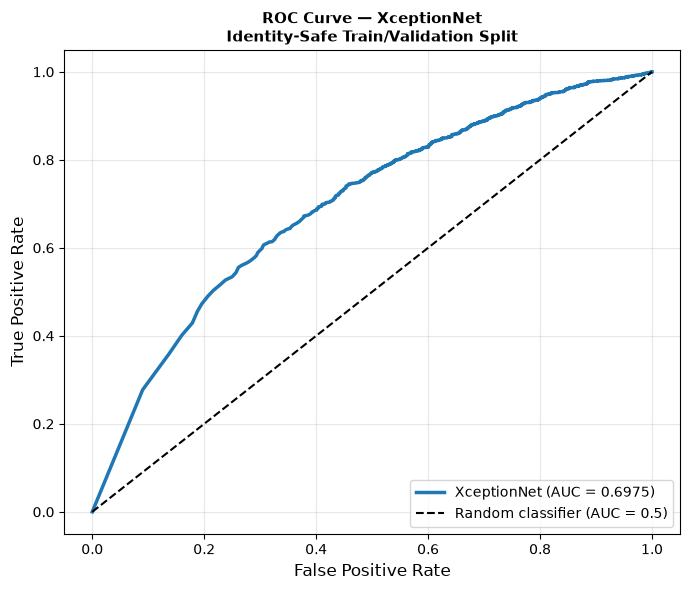

In [12]:
# Figure - ROC Curve 

from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

fpr, tpr, thresholds = roc_curve(all_labels, all_probs)
auc = roc_auc_score(all_labels, all_probs)

fig, ax = plt.subplots(figsize=(7, 6))

ax.plot(
    fpr, tpr,
    linewidth=2.5,
    label=f'XceptionNet (AUC = {auc:.4f})'
)

ax.plot(
    [0, 1], [0, 1],
    'k--',
    linewidth=1.5,
    label='Random classifier (AUC = 0.5)'
)

ax.set_xlabel('False Positive Rate', fontsize=12)
ax.set_ylabel('True Positive Rate', fontsize=12)

ax.set_title(
    "ROC Curve — XceptionNet\n"
    "Identity-Safe Train/Validation Split",
    fontsize=11,
    fontweight='bold'
)

ax.legend(fontsize=10, loc='lower right')
ax.grid(True, alpha=0.3)

plt.tight_layout()

plt.savefig(
    f'{RESULTS_DIR}\\figure_roc_curve_final.png',
    dpi=200,
    bbox_inches='tight'
)

plt.show()


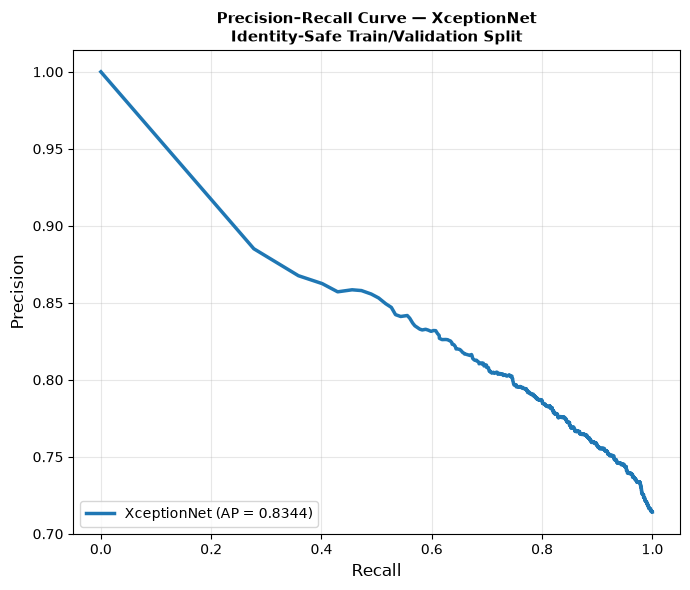

Average Precision: 0.8344


In [13]:
# Figure  — Precision-Recall Curve

from sklearn.metrics import precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt

precision, recall, pr_thresholds = precision_recall_curve(
    all_labels,
    all_probs
)

average_precision = average_precision_score(
    all_labels,
    all_probs
)

fig, ax = plt.subplots(figsize=(7, 6))

ax.plot(
    recall,
    precision,
    linewidth=2.5,
    label=f'XceptionNet (AP = {average_precision:.4f})'
)

ax.set_xlabel('Recall', fontsize=12)
ax.set_ylabel('Precision', fontsize=12)

ax.set_title(
    'Precision–Recall Curve — XceptionNet\n'
    'Identity-Safe Train/Validation Split',
    fontsize=11,
    fontweight='bold'
)

ax.legend(fontsize=10, loc='lower left')
ax.grid(True, alpha=0.3)

plt.tight_layout()

plt.savefig(
    f'{RESULTS_DIR}\\figure_precision_recall_curve_final.png',
    dpi=200,
    bbox_inches='tight'
)

plt.show()

print(f"Average Precision: {average_precision:.4f}")

In [21]:
import torch, shap, numpy as np, os, time, gc, pickle, json, random
from PIL import Image
import torchvision.transforms as transforms
from collections import defaultdict
import torch.nn as nn
import timm
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
MODELS_DIR  = r"C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\models"
OUT_BASE    = r"C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\data\frames"
RESULTS_DIR = r"C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results"
MASK_BASE   = rf"{OUT_BASE}\ff\masks"
os.makedirs(f'{RESULTS_DIR}\\shap', exist_ok=True)

model_v5 = timm.create_model('xception', pretrained=False, num_classes=1)
checkpoint = torch.load(os.path.join(MODELS_DIR, 'xceptionnet_video_v5_identitysafe.pth'), map_location='cpu')
model_v5.load_state_dict(checkpoint['model_state_dict'])
model_v5 = model_v5.cpu()
model_v5.eval()
for m in model_v5.modules():
    if hasattr(m, 'inplace'):
        m.inplace = False
print(f"Model loaded — AUC: {checkpoint['val_auc']:.4f}", flush=True)

class SHAPWrapper(nn.Module):
    def __init__(self, m):
        super().__init__()
        self.model = m
    def forward(self, x):
        return torch.sigmoid(self.model(x.clone()).clone())

shap_model = SHAPWrapper(model_v5)
shap_model.eval()

shap_transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize([0.5,0.5,0.5],[0.5,0.5,0.5])
])

def load_299(img_path):
    img = Image.open(img_path).convert('RGB')
    display = np.array(img.resize((299,299))) / 255.0
    tensor = shap_transform(img).unsqueeze(0)
    return tensor, display

real_folder = f'{OUT_BASE}\\ff\\real'
real_files = sorted([f for f in os.listdir(real_folder) if f.endswith('.jpg')])[:5]
bg = torch.cat([load_299(os.path.join(real_folder, f))[0] for f in real_files], dim=0)
explainer = shap.GradientExplainer(shap_model, bg)
print(f"Background: {bg.shape} — explainer ready", flush=True)

# ============================================================
# Folders 
# ============================================================
sample_folders = {
    'Real_FF':          f'{OUT_BASE}\\ff\\real',
    'Deepfakes_FF':     f'{OUT_BASE}\\ff\\fake\\deepfakes',
    'Face2Face_FF':     f'{OUT_BASE}\\ff\\fake\\face2face',
    'FaceSwap_FF':      f'{OUT_BASE}\\ff\\fake\\faceswap',
    'NeuralTextures_FF':f'{OUT_BASE}\\ff\\fake\\neuraltextures',
    'Real_Celeb':       f'{OUT_BASE}\\celebdf\\real',
    'Fake_Celeb':       f'{OUT_BASE}\\celebdf\\fake',
}
mask_folders = {
    'Deepfakes_FF':     f'{MASK_BASE}\\deepfakes',
    'Face2Face_FF':     f'{MASK_BASE}\\face2face',
    'FaceSwap_FF':      f'{MASK_BASE}\\faceswap',
    'NeuralTextures_FF':f'{MASK_BASE}\\neuraltextures',
}

N_PER_CATEGORY = 5

def select_diverse_images(folder, n, seed=42):
    files = sorted([f for f in os.listdir(folder) if f.endswith('.jpg')])
    by_video = defaultdict(list)
    for f in files:
        vid = f.rsplit('_f', 1)[0]
        by_video[vid].append(f)
    video_ids = sorted(by_video.keys())
    rng = random.Random(seed)
    rng.shuffle(video_ids)
    selected = []
    for vid in video_ids:
        if len(selected) >= n:
            break
        frames = sorted(by_video[vid])
        selected.append(frames[len(frames)//2])
    return selected[:n]

selected_files = {}
for category, folder in sample_folders.items():
    chosen = select_diverse_images(folder, N_PER_CATEGORY, seed=42)
    selected_files[category] = chosen
    print(f"{category}: {chosen}")

with open(f'{RESULTS_DIR}\\shap\\selected_images_35.json', 'w') as f:
    json.dump(selected_files, f, indent=2)

# ============================================================
# Deletion test - fidelity
# ============================================================
def fidelity_score(model_wrapper, img_tensor, signed_map, top_frac=0.2):
    abs_map = np.abs(signed_map)
    flat = abs_map.flatten()
    k = max(1, int(len(flat) * top_frac))
    threshold = np.partition(flat, -k)[-k]
    mask = abs_map >= threshold
    mask_t = torch.tensor(mask).unsqueeze(0).unsqueeze(0).expand(1,3,299,299)
    perturbed = img_tensor.clone()
    perturbed[mask_t] = 0.0
    with torch.no_grad():
        orig_pred = model_wrapper(img_tensor).item()
        pert_pred = model_wrapper(perturbed).item()
    return abs(orig_pred - pert_pred)

# ================================================================
# Localisation IoU - ground-truth masks - Only for FaceForensics++
# ================================================================
def load_mask(mask_path, shape=(299,299)):
    m = Image.open(mask_path).convert('L').resize(shape)
    m = np.array(m) > 127  # binarize
    return m

def localisation_iou(signed_map, gt_mask, top_frac=0.2):
    abs_map = np.abs(signed_map)
    flat = abs_map.flatten()
    k = max(1, int(len(flat) * top_frac))
    threshold = np.partition(flat, -k)[-k]
    attribution_mask = abs_map >= threshold
    intersection = np.logical_and(attribution_mask, gt_mask).sum()
    union = np.logical_or(attribution_mask, gt_mask).sum()
    return intersection / union if union > 0 else 0.0

# ============================================================
# Generate 
# ============================================================
save_raw_path = f'{RESULTS_DIR}\\shap\\shap_final_35images.pkl'

if os.path.exists(save_raw_path):
    with open(save_raw_path, 'rb') as f:
        raw_results = pickle.load(f)
    done_keys = set((r['category'], r['filename']) for r in raw_results)
    print(f"Resuming — {len(raw_results)} images already done", flush=True)
else:
    raw_results = []
    done_keys = set()

for category, fnames in selected_files.items():
    folder = sample_folders[category]
    for fname in fnames:
        if (category, fname) in done_keys:
            continue
        gc.collect()
        img_path = os.path.join(folder, fname)
        try:
            img_tensor, img_display = load_299(img_path)
            with torch.no_grad():
                pred = shap_model(img_tensor).item()

            t0 = time.time()
            sv = explainer.shap_values(img_tensor)
            gen_time = time.time() - t0
            if isinstance(sv, list):
                sv = sv[0]
            sv_np = sv.squeeze()
            signed = sv_np.sum(axis=0)

            true_label = 'real' if 'Real' in category else 'fake'
            predicted = 'fake' if pred > 0.5 else 'real'
            mean_abs_shap = float(np.abs(sv_np).mean())
            fidelity = fidelity_score(shap_model, img_tensor, signed)

            iou = np.nan
            if category in mask_folders:
                mask_path = os.path.join(mask_folders[category], fname.replace('.jpg', '.png'))
                if os.path.exists(mask_path):
                    gt_mask = load_mask(mask_path)
                    iou = localisation_iou(signed, gt_mask)

            raw_results.append({
                'category': category, 'filename': fname, 'image_path': img_path,
                'image_display': img_display, 'true_label': true_label,
                'prediction': pred, 'predicted_label': predicted,
                'correct': true_label == predicted, 'shap_raw': sv_np,
                'signed_map': signed, 'mean_abs_shap': mean_abs_shap,
                'fidelity': fidelity, 'localisation_iou': iou,
                'generation_time': gen_time,
            })
            print(f"  {category}/{fname}: pred={pred:.3f} IoU={iou} fid={fidelity:.4f} time={gen_time:.1f}s", flush=True)

            with open(save_raw_path, 'wb') as f:
                pickle.dump(raw_results, f)

        except Exception as e:
            print(f"  FAILED {category}/{fname}: {str(e)[:100]}", flush=True)

print(f"\nDone: {len(raw_results)}/{sum(len(v) for v in selected_files.values())} images", flush=True)

C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\.venv\Lib\site-packages\timm\models\_factory.py:138: UserWarning: Mapping deprecated model name xception to current legacy_xception.
  model = create_fn(


Model loaded — AUC: 0.6975


C:\Users\aditi\AppData\Local\Temp\ipykernel_17608\207964031.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(os.path.join(MODELS_DIR, 'xceptionne

Background: torch.Size([5, 3, 299, 299]) — explainer ready
Real_FF: ['438_f07.jpg', '942_f07.jpg', '779_f07.jpg', '943_f07.jpg', '529_f07.jpg']
Deepfakes_FF: ['438_434_f07.jpg', '942_943_f07.jpg', '779_794_f07.jpg', '943_942_f07.jpg', '529_633_f07.jpg']
Face2Face_FF: ['438_434_f07.jpg', '942_943_f07.jpg', '779_794_f07.jpg', '943_942_f07.jpg', '529_633_f07.jpg']
FaceSwap_FF: ['438_434_f07.jpg', '942_943_f07.jpg', '779_794_f07.jpg', '943_942_f07.jpg', '529_633_f07.jpg']
NeuralTextures_FF: ['438_434_f07.jpg', '942_943_f07.jpg', '779_794_f07.jpg', '943_942_f07.jpg', '529_633_f07.jpg']
Real_Celeb: ['id2_0001_f07.jpg', 'id25_0003_f07.jpg', 'id21_0006_f07.jpg', 'id36_0004_f07.jpg', 'id32_0006_f07.jpg']
Fake_Celeb: ['id2_id17_0003_f07.jpg', 'id25_id26_0003_f07.jpg', 'id21_id17_0008_f07.jpg', 'id37_id6_0002_f07.jpg', 'id32_id23_0002_f07.jpg']
  Real_FF/438_f07.jpg: pred=0.000 IoU=nan fid=0.1565 time=209.1s
  Real_FF/942_f07.jpg: pred=0.001 IoU=nan fid=0.2364 time=196.9s
  Real_FF/779_f07.jpg: p

In [33]:
for r in raw_results:
    if not r['correct']:
        signed = r['signed_map']
        print(f"{r['category']}/{r['filename']}: pred={r['prediction']:.3f}, true={r['true_label']}")
        # peak attribution location - rough esimate 
        peak_y, peak_x = np.unravel_index(np.argmax(np.abs(signed)), signed.shape)
        print(f"  Peak attribution at pixel ({peak_x},{peak_y}) out of (299,299)")

Real_Celeb/id25_0003_f07.jpg: pred=0.997, true=real
  Peak attribution at pixel (221,75) out of (299,299)
Real_Celeb/id32_0006_f07.jpg: pred=0.958, true=real
  Peak attribution at pixel (229,98) out of (299,299)


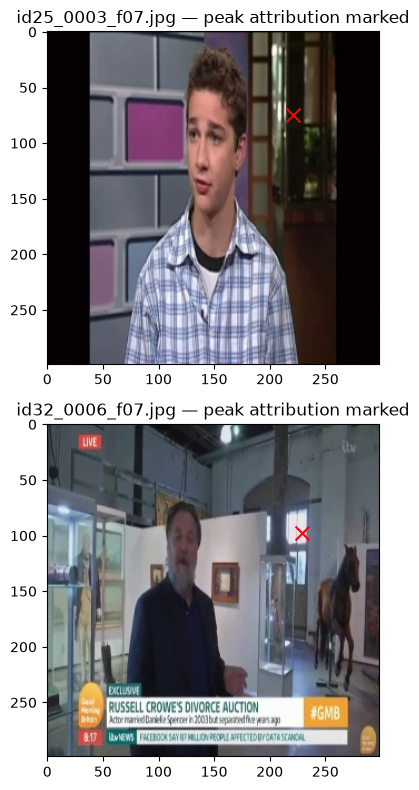

Saved: C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results\shap\misclassified_celeb_peak_attribution.png


In [34]:
#misclassified images 
misclassified = [r for r in raw_results if not r['correct']]

fig, axes = plt.subplots(len(misclassified), 1, figsize=(4, 4*len(misclassified)))
if len(misclassified) == 1:
    axes = [axes]

for ax, r in zip(axes, misclassified):
    ax.imshow(r['image_display'])
    peak_x = 221 if 'id25' in r['filename'] else 229
    peak_y = 75 if 'id25' in r['filename'] else 98
    ax.scatter([peak_x], [peak_y], color='red', s=100, marker='x')
    ax.set_title(f"{r['filename']} — peak attribution marked")

plt.tight_layout()
save_path = f'{RESULTS_DIR}\\shap\\misclassified_celeb_peak_attribution.png'
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print(f"Saved: {save_path}")

In [3]:
# #Consistency — FULL 

N_CONSISTENCY_SUBSET = 5
consistency_targets = []
for category in sample_folders.keys():
    cat_items = [r for r in raw_results if r['category'] == category][:N_CONSISTENCY_SUBSET]
    consistency_targets.extend(cat_items)
print(f"Running consistency check on {len(consistency_targets)} images", flush=True)

consistency_save_path = f'{RESULTS_DIR}\\shap\\shap_consistency_all35.pkl'  
if os.path.exists(consistency_save_path):
    with open(consistency_save_path, 'rb') as f:
        consistency_scores = pickle.load(f)
else:
    consistency_scores = {}

for r in consistency_targets:
    key = (r['category'], r['filename'])
    if key in consistency_scores:
        continue
    img_tensor, _ = load_299(r['image_path'])
    sv2 = explainer.shap_values(img_tensor)
    if isinstance(sv2, list):
        sv2 = sv2[0]
    map2 = sv2.squeeze().sum(axis=0)
    map1 = r['signed_map']
    corr = float(np.corrcoef(map1.flatten(), map2.flatten())[0, 1])
    consistency_scores[key] = corr
    print(f"  {key}: consistency={corr:.4f}", flush=True)
    with open(consistency_save_path, 'wb') as f:
        pickle.dump(consistency_scores, f)

for r in raw_results:
    key = (r['category'], r['filename'])
    r['consistency'] = consistency_scores.get(key, np.nan)

print("Consistency scores attached for all 35 images.")

with open(save_raw_path, 'wb') as f:
    pickle.dump(raw_results, f)
print("Saved.")

Running consistency check on 35 images
  ('Real_FF', '438_f07.jpg'): consistency=0.8970
  ('Real_FF', '942_f07.jpg'): consistency=0.9671
  ('Real_FF', '779_f07.jpg'): consistency=0.9770
  ('Real_FF', '943_f07.jpg'): consistency=0.9242
  ('Real_FF', '529_f07.jpg'): consistency=0.9654
  ('Deepfakes_FF', '438_434_f07.jpg'): consistency=0.8533
  ('Deepfakes_FF', '942_943_f07.jpg'): consistency=0.9407
  ('Deepfakes_FF', '779_794_f07.jpg'): consistency=0.9095
  ('Deepfakes_FF', '943_942_f07.jpg'): consistency=0.9772
  ('Deepfakes_FF', '529_633_f07.jpg'): consistency=0.9202
  ('Face2Face_FF', '438_434_f07.jpg'): consistency=0.8945
  ('Face2Face_FF', '942_943_f07.jpg'): consistency=0.9698
  ('Face2Face_FF', '779_794_f07.jpg'): consistency=0.9656
  ('Face2Face_FF', '943_942_f07.jpg'): consistency=0.9531
  ('Face2Face_FF', '529_633_f07.jpg'): consistency=0.9375
  ('FaceSwap_FF', '438_434_f07.jpg'): consistency=0.9583
  ('FaceSwap_FF', '942_943_f07.jpg'): consistency=0.9472
  ('FaceSwap_FF', '779

In [23]:
with open(save_raw_path, 'wb') as f:
    pickle.dump(raw_results, f)
print(f"Saved {len(raw_results)} results with consistency scores to {save_raw_path}")

Saved 35 results with consistency scores to C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results\shap\shap_final_35images.pkl


In [4]:
with open(save_raw_path, 'rb') as f:
    check = pickle.load(f)

has_consistency = sum(1 for r in check if not np.isnan(r['consistency']))
print(f"{has_consistency} out of {len(check)} have consistency scores")

35 out of 35 have consistency scores


In [5]:
#SHAP Table
import pandas as pd

df_shap = pd.DataFrame([{
    'category': r['category'],
    'filename': r['filename'],
    'true_label': r['true_label'],
    'prediction': r['prediction'],
    'predicted_label': r['predicted_label'],
    'correct': r['correct'],
    'mean_abs_shap': r['mean_abs_shap'],
    'localisation_iou': r['localisation_iou'],
    'fidelity': r['fidelity'],
    'consistency': r['consistency'],
    'generation_time': r['generation_time'],
} for r in raw_results])

csv_path = f'{RESULTS_DIR}\\shap\\shap_metrics_final.csv'
df_shap.to_csv(csv_path, index=False)
print(f"Saved: {csv_path}")

summary = df_shap.groupby('category').agg(
    mean_abs_shap_mean=('mean_abs_shap','mean'),
    fidelity_mean=('fidelity','mean'),
    fidelity_median=('fidelity','median'),
    consistency_mean=('consistency','mean'),
    generation_time_mean=('generation_time','mean'),
    localisation_iou_mean=('localisation_iou','mean'),
    n_images=('filename','count'),
).round(4)

summary_path = f'{RESULTS_DIR}\\shap\\shap_category_summary_final.csv'
summary.to_csv(summary_path)
print(f"Saved: {summary_path}")
summary

Saved: C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results\shap\shap_metrics_final.csv
Saved: C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results\shap\shap_category_summary_final.csv


,mean_abs_shap_mean,fidelity_mean,fidelity_median,consistency_mean,generation_time_mean,localisation_iou_mean,n_images
category,,,,,,,
Deepfakes_FF,0.0004,0.4006,0.5519,0.9202,176.4051,0.0782,5
Face2Face_FF,0.0006,0.6270,0.6136,0.9441,163.1642,0.0984,5
FaceSwap_FF,0.0005,0.5776,0.6849,0.9440,161.7386,0.0777,5
Fake_Celeb,0.0008,0.4901,0.7082,0.9517,150.9316,NaN,5
NeuralTextures_FF,0.0007,0.6484,0.6178,0.9607,153.4277,0.1128,5
Real_Celeb,0.0008,0.2827,0.2685,0.9717,166.2569,NaN,5
Real_FF,0.0006,0.1859,0.1565,0.9462,165.9850,NaN,5


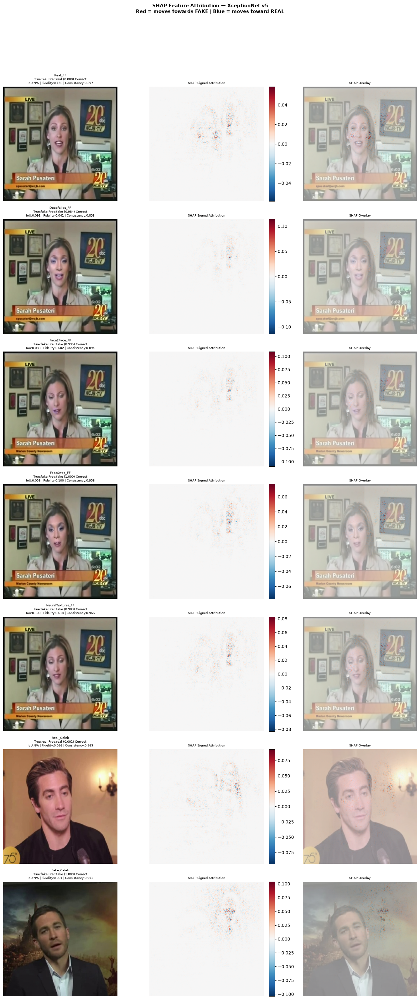

Saved: C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results\shap\shap_summary_finalpic.png


In [6]:
#Visualisation 
import matplotlib.pyplot as plt

fig, axes = plt.subplots(len(sample_folders), 3, figsize=(14, 4.5*len(sample_folders)))
fig.suptitle('SHAP Feature Attribution — XceptionNet v5\nRed = moves towards FAKE | Blue = moves toward REAL',
             fontsize=11, fontweight='bold', y=1.01)

for row, category in enumerate(sample_folders.keys()):
    r = next(x for x in raw_results if x['category'] == category)
    status = 'Correct' if r['correct'] else 'Incorrect'
    signed = r['signed_map']
    max_abs = max(abs(signed.min()), abs(signed.max())) + 1e-8
    #IOU
    iou_str = f"{r['localisation_iou']:.3f}" if not np.isnan(r['localisation_iou']) else "N/A"

    #consistency 
    repro_str = ( f"{r['consistency']:.3f}"if not np.isnan(r['consistency'])else "N/A")
    #original image 
    axes[row, 0].imshow(r['image_display'])

    axes[row, 0].set_title(
        f"{category}\n"
        f"True:{r['true_label']} "
        f"Pred:{r['predicted_label']} "
        f"({r['prediction']:.3f}) {status}\n"
        f"IoU:{iou_str} | "
        f"Fidelity:{r['fidelity']:.3f} | "
        f"Consistency:{repro_str}",
        fontsize=7
    )

    axes[row, 0].axis('off')

    #SHAP
    im = axes[row,1].imshow(signed, cmap='RdBu_r', vmin=-max_abs, vmax=max_abs)
    axes[row,1].set_title('SHAP Signed Attribution', fontsize=7)
    axes[row,1].axis('off')
    plt.colorbar(im, ax=axes[row,1], fraction=0.046, pad=0.04)
  
    #SHAP overlay 
    axes[row,2].imshow(r['image_display'])
    axes[row,2].imshow(signed, cmap='RdBu_r', alpha=0.55, vmin=-max_abs, vmax=max_abs)
    axes[row,2].set_title('SHAP Overlay', fontsize=7)
    axes[row,2].axis('off')

plt.tight_layout(rect=[0,0,1,0.96])
save_path = f'{RESULTS_DIR}\\shap\\shap_summary_finalpic.png'
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print(f"Saved: {save_path}")

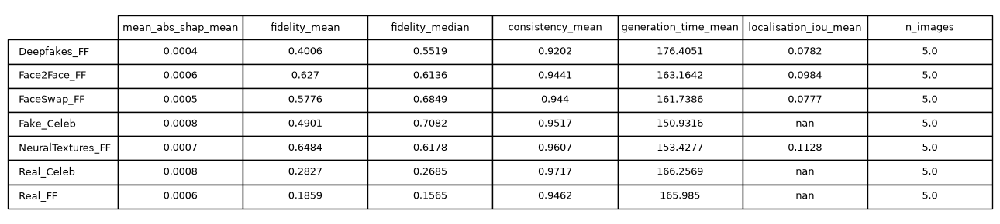

Saved: C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results\shap\shap_full_final_summary_table.png


In [7]:
#Full SHAP table saved as image 
import pandas as pd
import matplotlib.pyplot as plt

summary_from_csv = pd.read_csv(
    f'{RESULTS_DIR}\\shap\\shap_category_summary_final.csv',
    index_col='category'
)

fig, ax = plt.subplots(figsize=(13, 3))
ax.axis('off')

tbl = ax.table(
    cellText=summary_from_csv.round(5).values,
    colLabels=summary_from_csv.round(5).columns,
    rowLabels=summary_from_csv.round(5).index,
    cellLoc='center',
    loc='center'
)
tbl.auto_set_font_size(False)
tbl.set_fontsize(9)
tbl.scale(1, 1.6)

plt.tight_layout()
save_path = f'{RESULTS_DIR}\\shap\\shap_full_final_summary_table.png'
plt.savefig(save_path, dpi=200, bbox_inches='tight')
plt.show()
print(f"Saved: {save_path}")

In [28]:
from lime import lime_image
from skimage.segmentation import mark_boundaries
import numpy as np, time, json 
from PIL import Image
import torch
import torchvision.transforms as transforms
import os
import sys
import timm
import torch.nn as nn
import gc
import pickle

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
MODELS_DIR  = r"C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\models"
OUT_BASE    = r"C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\data\frames"
RESULTS_DIR = r"C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results"
MASK_BASE   = rf"{OUT_BASE}\ff\masks"
os.makedirs(f'{RESULTS_DIR}\\lime', exist_ok=True)

model_v5 = timm.create_model('xception', pretrained=False, num_classes=1)
checkpoint = torch.load(os.path.join(MODELS_DIR, 'xceptionnet_video_v5_identitysafe.pth'), map_location='cpu')
model_v5.load_state_dict(checkpoint['model_state_dict'])
model_v5 = model_v5.cpu()
model_v5.eval()
for m in model_v5.modules():
    if hasattr(m, 'inplace'):
        m.inplace = False
print(f"Model loaded — AUC: {checkpoint['val_auc']:.4f}", flush=True)



lime_transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize([0.5,0.5,0.5],[0.5,0.5,0.5])
])

def load_299_display(img_path):
    img = Image.open(img_path).convert('RGB')
    display = np.array(img.resize((299,299))) / 255.0
    return display

def predict_fn(images_np):
    BATCH_SIZE = 32
    all_probs = []
    for i in range(0, len(images_np), BATCH_SIZE):
        chunk = images_np[i:i+BATCH_SIZE]
        batch = torch.stack([lime_transform(Image.fromarray(im.astype(np.uint8))) for im in chunk])
        with torch.no_grad():
            out = model_v5(batch)
            probs_fake = torch.sigmoid(out).cpu().numpy().flatten()
        all_probs.append(probs_fake)
        print(f"    predict_fn: {min(i+BATCH_SIZE, len(images_np))}/{len(images_np)}", flush=True)
    probs_fake = np.concatenate(all_probs)
    probs_real = 1 - probs_fake
    return np.stack([probs_real, probs_fake], axis=1)

explainer = lime_image.LimeImageExplainer(random_state=42)
print("LIME explainer ready", flush=True)

# ============================================================
# Select images, the same ones used by SHAP 
# ============================================================
with open(f'{RESULTS_DIR}\\shap\\selected_images_35.json', 'r') as f:
    selected_files = json.load(f)

sample_folders = {
    'Real_FF':          f'{OUT_BASE}\\ff\\real',
    'Deepfakes_FF':     f'{OUT_BASE}\\ff\\fake\\deepfakes',
    'Face2Face_FF':     f'{OUT_BASE}\\ff\\fake\\face2face',
    'FaceSwap_FF':      f'{OUT_BASE}\\ff\\fake\\faceswap',
    'NeuralTextures_FF':f'{OUT_BASE}\\ff\\fake\\neuraltextures',
    'Real_Celeb':       f'{OUT_BASE}\\celebdf\\real',
    'Fake_Celeb':       f'{OUT_BASE}\\celebdf\\fake',
}
mask_folders = {
    'Deepfakes_FF':     f'{MASK_BASE}\\deepfakes',
    'Face2Face_FF':     f'{MASK_BASE}\\face2face',
    'FaceSwap_FF':      f'{MASK_BASE}\\faceswap',
    'NeuralTextures_FF':f'{MASK_BASE}\\neuraltextures',
}

print("Reusing SHAP's selected images:", flush=True)
for cat, files in selected_files.items():
    print(f"  {cat}: {files}", flush=True)

# ============================================================
# deletion test — same fidelity test, used in SHAP
# ============================================================
def fidelity_score_lime(img_tensor_orig_pred, img_np, top_mask, model):
    """top_mask: boolean (299,299) array marking the most important LIME segments."""
    perturbed_np = img_np.copy()
    perturbed_np[top_mask] = 0.0  # zero out important region
    perturbed_pil = Image.fromarray((perturbed_np*255).astype(np.uint8))
    perturbed_t = lime_transform(perturbed_pil).unsqueeze(0)
    with torch.no_grad():
        pert_pred = torch.sigmoid(model(perturbed_t)).item()
    return abs(img_tensor_orig_pred - pert_pred)

# ============================================================
# Localisation IoU - only for FaceForensics++
# ============================================================
def load_mask(mask_path, shape=(299,299)):
    m = Image.open(mask_path).convert('L').resize(shape)
    return np.array(m) > 127

def localisation_iou_lime(top_mask, gt_mask):
    intersection = np.logical_and(top_mask, gt_mask).sum()
    union = np.logical_or(top_mask, gt_mask).sum()
    return intersection / union if union > 0 else 0.0

# ============================================================
# LIME generation 
# ============================================================
save_raw_path = f'{RESULTS_DIR}\\lime\\lime_final_images.pkl'

if os.path.exists(save_raw_path):
    with open(save_raw_path, 'rb') as f:
        lime_results = pickle.load(f)
    done_keys = set((r['category'], r['filename']) for r in lime_results)
    print(f"Resuming — {len(lime_results)} images already done", flush=True)
else:
    lime_results = []
    done_keys = set()

NUM_SAMPLES = 300  # perturbations per image 
TOP_FRAC = 0.2      # top 20% of image area

for category, fnames in selected_files.items():
    folder = sample_folders[category]
    for fname in fnames:
        if (category, fname) in done_keys:
            continue
        gc.collect()
        img_path = os.path.join(folder, fname)
        try:
            img_display = load_299_display(img_path)
            img_uint8 = (img_display * 255).astype(np.uint8)

            img_tensor = lime_transform(Image.fromarray(img_uint8)).unsqueeze(0)
            with torch.no_grad():
                pred = torch.sigmoid(model_v5(img_tensor)).item()

            t0 = time.time()
            explanation = explainer.explain_instance(
                img_uint8,
                predict_fn,
                top_labels=2,
                hide_color=0,
                num_samples=NUM_SAMPLES,
                random_seed=42
            )
            gen_time = time.time() - t0

            label_to_explain = 1  # index 1 - fake 
            temp, mask_pos = explanation.get_image_and_mask(
                label_to_explain, positive_only=True, num_features=8, hide_rest=False
            )
            
            # Build a pixel-level boolean mask of important region
            segments = explanation.segments
            local_exp = dict(explanation.local_exp[label_to_explain])
            # rank segments by weight 
            ranked_segments = sorted(
                local_exp.items(),
                key=lambda x: abs(x[1]),
                reverse=True)

            total_pixels = segments.size
            target_pixels = total_pixels * TOP_FRAC
            top_mask = np.zeros(segments.shape, dtype=bool)
            covered = 0

            for seg_id, weight in ranked_segments:
                seg_pixels = (segments == seg_id)
                top_mask |= seg_pixels
                covered += seg_pixels.sum()

                if covered >= target_pixels:
                    break

            true_label = 'real' if 'Real' in category else 'fake'
            predicted = 'fake' if pred > 0.5 else 'real'

            fidelity = fidelity_score_lime(pred, img_display, top_mask, model_v5)

            iou = np.nan
            if category in mask_folders:
                mask_path = os.path.join(mask_folders[category], fname.replace('.jpg', '.png'))
                if os.path.exists(mask_path):
                    gt_mask = load_mask(mask_path)
                    iou = localisation_iou_lime(top_mask, gt_mask)

            lime_results.append({
                'category': category, 'filename': fname, 'image_path': img_path,
                'image_display': img_display, 'true_label': true_label,
                'prediction': pred, 'predicted_label': predicted,
                'correct': true_label == predicted,
                'top_mask': top_mask, 'segments': segments,
                'fidelity': fidelity, 'localisation_iou': iou,
                'generation_time': gen_time,
            })
            print(f"  {category}/{fname}: pred={pred:.3f} IoU={iou} fid={fidelity:.4f} time={gen_time:.1f}s", flush=True)

            with open(save_raw_path, 'wb') as f:
                pickle.dump(lime_results, f)

        except Exception as e:
            print(f"  FAILED {category}/{fname}: {str(e)[:150]}", flush=True)

print(f"\nDone: {len(lime_results)}/{sum(len(v) for v in selected_files.values())} images", flush=True)

C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\.venv\Lib\site-packages\timm\models\_factory.py:138: UserWarning: Mapping deprecated model name xception to current legacy_xception.
  model = create_fn(
C:\Users\aditi\AppData\Local\Temp\ipykernel_17608\2790450135.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=T

Model loaded — AUC: 0.6975
LIME explainer ready
Reusing SHAP's selected images:
  Real_FF: ['438_f07.jpg', '942_f07.jpg', '779_f07.jpg', '943_f07.jpg', '529_f07.jpg']
  Deepfakes_FF: ['438_434_f07.jpg', '942_943_f07.jpg', '779_794_f07.jpg', '943_942_f07.jpg', '529_633_f07.jpg']
  Face2Face_FF: ['438_434_f07.jpg', '942_943_f07.jpg', '779_794_f07.jpg', '943_942_f07.jpg', '529_633_f07.jpg']
  FaceSwap_FF: ['438_434_f07.jpg', '942_943_f07.jpg', '779_794_f07.jpg', '943_942_f07.jpg', '529_633_f07.jpg']
  NeuralTextures_FF: ['438_434_f07.jpg', '942_943_f07.jpg', '779_794_f07.jpg', '943_942_f07.jpg', '529_633_f07.jpg']
  Real_Celeb: ['id2_0001_f07.jpg', 'id25_0003_f07.jpg', 'id21_0006_f07.jpg', 'id36_0004_f07.jpg', 'id32_0006_f07.jpg']
  Fake_Celeb: ['id2_id17_0003_f07.jpg', 'id25_id26_0003_f07.jpg', 'id21_id17_0008_f07.jpg', 'id37_id6_0002_f07.jpg', 'id32_id23_0002_f07.jpg']


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Real_FF/438_f07.jpg: pred=0.000 IoU=nan fid=0.1792 time=46.1s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Real_FF/942_f07.jpg: pred=0.001 IoU=nan fid=0.5005 time=37.3s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Real_FF/779_f07.jpg: pred=0.032 IoU=nan fid=0.8012 time=40.2s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Real_FF/943_f07.jpg: pred=0.093 IoU=nan fid=0.8510 time=49.7s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Real_FF/529_f07.jpg: pred=0.046 IoU=nan fid=0.6787 time=49.1s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Deepfakes_FF/438_434_f07.jpg: pred=0.984 IoU=0.1659735349716446 fid=0.5536 time=52.7s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Deepfakes_FF/942_943_f07.jpg: pred=0.999 IoU=0.12417796958487463 fid=0.6592 time=51.9s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Deepfakes_FF/779_794_f07.jpg: pred=1.000 IoU=0.0597880423915217 fid=0.3014 time=52.1s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Deepfakes_FF/943_942_f07.jpg: pred=1.000 IoU=0.11940298507462686 fid=0.2288 time=48.3s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Deepfakes_FF/529_633_f07.jpg: pred=1.000 IoU=0.12198612793130023 fid=0.6639 time=49.5s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Face2Face_FF/438_434_f07.jpg: pred=0.995 IoU=0.17105263157894737 fid=0.7711 time=49.9s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Face2Face_FF/942_943_f07.jpg: pred=1.000 IoU=0.2226061204343534 fid=0.6971 time=50.7s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Face2Face_FF/779_794_f07.jpg: pred=0.993 IoU=0.08230160894464139 fid=0.2575 time=49.5s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Face2Face_FF/943_942_f07.jpg: pred=0.968 IoU=0.1522440903884203 fid=0.3563 time=51.4s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Face2Face_FF/529_633_f07.jpg: pred=0.995 IoU=0.12769370621891876 fid=0.4418 time=52.7s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  FaceSwap_FF/438_434_f07.jpg: pred=1.000 IoU=0.14178690344062153 fid=0.7404 time=51.6s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  FaceSwap_FF/942_943_f07.jpg: pred=0.999 IoU=0.1875676739836598 fid=0.2868 time=51.1s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  FaceSwap_FF/779_794_f07.jpg: pred=0.999 IoU=0.06337218847479888 fid=0.6639 time=49.9s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  FaceSwap_FF/943_942_f07.jpg: pred=0.998 IoU=0.11004520895357812 fid=0.1416 time=51.0s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  FaceSwap_FF/529_633_f07.jpg: pred=1.000 IoU=0.09276754737123032 fid=0.7666 time=51.8s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  NeuralTextures_FF/438_434_f07.jpg: pred=0.983 IoU=0.15854622070055308 fid=0.8922 time=52.4s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  NeuralTextures_FF/942_943_f07.jpg: pred=0.997 IoU=0.13993027365203686 fid=0.8418 time=48.2s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  NeuralTextures_FF/779_794_f07.jpg: pred=0.896 IoU=0.03946240923645876 fid=0.2904 time=50.2s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  NeuralTextures_FF/943_942_f07.jpg: pred=0.746 IoU=0.14767977141647706 fid=0.0726 time=50.6s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  NeuralTextures_FF/529_633_f07.jpg: pred=0.982 IoU=0.09688063934003609 fid=0.6685 time=48.1s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Real_Celeb/id2_0001_f07.jpg: pred=0.001 IoU=nan fid=0.6010 time=49.4s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Real_Celeb/id25_0003_f07.jpg: pred=0.997 IoU=nan fid=0.3414 time=51.8s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Real_Celeb/id21_0006_f07.jpg: pred=0.095 IoU=nan fid=0.6222 time=53.2s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Real_Celeb/id36_0004_f07.jpg: pred=0.339 IoU=nan fid=0.1044 time=50.0s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Real_Celeb/id32_0006_f07.jpg: pred=0.958 IoU=nan fid=0.4662 time=52.7s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Fake_Celeb/id2_id17_0003_f07.jpg: pred=1.000 IoU=nan fid=0.0251 time=45.4s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Fake_Celeb/id25_id26_0003_f07.jpg: pred=0.999 IoU=nan fid=0.5364 time=49.5s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Fake_Celeb/id21_id17_0008_f07.jpg: pred=1.000 IoU=nan fid=0.0048 time=48.2s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Fake_Celeb/id37_id6_0002_f07.jpg: pred=1.000 IoU=nan fid=0.4403 time=53.6s


  0%|          | 0/300 [00:00<?, ?it/s]

    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
    predict_fn: 10/10
  Fake_Celeb/id32_id23_0002_f07.jpg: pred=0.999 IoU=nan fid=0.3214 time=49.4s

Done: 35/35 images


In [9]:
#Consistency 
N_CONSISTENCY_SUBSET = 5
consistency_targets = []
for category in sample_folders.keys():
    cat_items = [r for r in lime_results if r['category'] == category][:N_CONSISTENCY_SUBSET]
    consistency_targets.extend(cat_items)
print(f"Running consistency check on {len(consistency_targets)} images", flush=True)

consistency_save_path = f'{RESULTS_DIR}\\lime\\lime_consistency_all35.pkl'  
if os.path.exists(consistency_save_path):
    with open(consistency_save_path, 'rb') as f:
        lime_consistency_scores = pickle.load(f)
else:
    lime_consistency_scores = {}

for r in consistency_targets:
    key = (r['category'], r['filename'])
    if key in lime_consistency_scores:
        continue
    img_display = r['image_display']
    img_uint8 = (img_display * 255).astype(np.uint8)
    explanation2 = explainer.explain_instance(
        img_uint8, predict_fn, top_labels=2, hide_color=0,
        num_samples=NUM_SAMPLES, random_seed=123
    )
    segments2 = explanation2.segments
    local_exp2 = dict(explanation2.local_exp[1])
    ranked2 = sorted(local_exp2.items(), key=lambda x: -x[1])
    total_pixels = segments2.size
    target_pixels = total_pixels * TOP_FRAC
    mask2 = np.zeros(segments2.shape, dtype=bool)
    covered = 0
    for seg_id, weight in ranked2:
        if weight <= 0:
            break
        seg_pixels = (segments2 == seg_id)
        mask2 |= seg_pixels
        covered += seg_pixels.sum()
        if covered >= target_pixels:
            break
    mask1 = r['top_mask']
    intersection = np.logical_and(mask1, mask2).sum()
    union = np.logical_or(mask1, mask2).sum()
    iou_consistency = intersection / union if union > 0 else 0.0
    lime_consistency_scores[key] = float(iou_consistency)
    print(f"  {key}: consistency(IoU)={iou_consistency:.4f}", flush=True)
    with open(consistency_save_path, 'wb') as f:
        pickle.dump(lime_consistency_scores, f)

for r in lime_results:
    key = (r['category'], r['filename'])
    r['consistency'] = lime_consistency_scores.get(key, np.nan)

print("Consistency scores attached for all 35 images.")

# save the results 
with open(f'{RESULTS_DIR}\\lime\\lime_final_35images.pkl', 'wb') as f:
    pickle.dump(lime_results, f)
print("Saved.")

Running consistency check on 35 images


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Real_FF', '438_f07.jpg'): consistency(IoU)=0.3128


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Real_FF', '942_f07.jpg'): consistency(IoU)=0.3060


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Real_FF', '779_f07.jpg'): consistency(IoU)=0.2581


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Real_FF', '943_f07.jpg'): consistency(IoU)=0.0922


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Real_FF', '529_f07.jpg'): consistency(IoU)=0.2224


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Deepfakes_FF', '438_434_f07.jpg'): consistency(IoU)=0.4048


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Deepfakes_FF', '942_943_f07.jpg'): consistency(IoU)=0.6384


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Deepfakes_FF', '779_794_f07.jpg'): consistency(IoU)=0.4941


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Deepfakes_FF', '943_942_f07.jpg'): consistency(IoU)=0.2902


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Deepfakes_FF', '529_633_f07.jpg'): consistency(IoU)=0.3140


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Face2Face_FF', '438_434_f07.jpg'): consistency(IoU)=0.5798


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Face2Face_FF', '942_943_f07.jpg'): consistency(IoU)=0.5506


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Face2Face_FF', '779_794_f07.jpg'): consistency(IoU)=0.4923


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Face2Face_FF', '943_942_f07.jpg'): consistency(IoU)=0.5390


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Face2Face_FF', '529_633_f07.jpg'): consistency(IoU)=0.3437


  0%|          | 0/300 [00:00<?, ?it/s]

  ('FaceSwap_FF', '438_434_f07.jpg'): consistency(IoU)=0.3276


  0%|          | 0/300 [00:00<?, ?it/s]

  ('FaceSwap_FF', '942_943_f07.jpg'): consistency(IoU)=0.3626


  0%|          | 0/300 [00:00<?, ?it/s]

  ('FaceSwap_FF', '779_794_f07.jpg'): consistency(IoU)=0.4084


  0%|          | 0/300 [00:00<?, ?it/s]

  ('FaceSwap_FF', '943_942_f07.jpg'): consistency(IoU)=0.6459


  0%|          | 0/300 [00:00<?, ?it/s]

  ('FaceSwap_FF', '529_633_f07.jpg'): consistency(IoU)=0.3996


  0%|          | 0/300 [00:00<?, ?it/s]

  ('NeuralTextures_FF', '438_434_f07.jpg'): consistency(IoU)=0.3502


  0%|          | 0/300 [00:00<?, ?it/s]

  ('NeuralTextures_FF', '942_943_f07.jpg'): consistency(IoU)=0.3450


  0%|          | 0/300 [00:00<?, ?it/s]

  ('NeuralTextures_FF', '779_794_f07.jpg'): consistency(IoU)=0.3913


  0%|          | 0/300 [00:00<?, ?it/s]

  ('NeuralTextures_FF', '943_942_f07.jpg'): consistency(IoU)=0.4337


  0%|          | 0/300 [00:00<?, ?it/s]

  ('NeuralTextures_FF', '529_633_f07.jpg'): consistency(IoU)=0.2605


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Real_Celeb', 'id2_0001_f07.jpg'): consistency(IoU)=0.2727


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Real_Celeb', 'id25_0003_f07.jpg'): consistency(IoU)=0.4721


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Real_Celeb', 'id21_0006_f07.jpg'): consistency(IoU)=0.2268


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Real_Celeb', 'id36_0004_f07.jpg'): consistency(IoU)=0.4352


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Real_Celeb', 'id32_0006_f07.jpg'): consistency(IoU)=0.3000


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Fake_Celeb', 'id2_id17_0003_f07.jpg'): consistency(IoU)=0.6766


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Fake_Celeb', 'id25_id26_0003_f07.jpg'): consistency(IoU)=0.4195


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Fake_Celeb', 'id21_id17_0008_f07.jpg'): consistency(IoU)=0.4663


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Fake_Celeb', 'id37_id6_0002_f07.jpg'): consistency(IoU)=0.3455


  0%|          | 0/300 [00:00<?, ?it/s]

  ('Fake_Celeb', 'id32_id23_0002_f07.jpg'): consistency(IoU)=0.4996
Consistency scores attached for all 35 images.
Saved.


In [10]:
#Check 
with open(f'{RESULTS_DIR}\\lime\\lime_final_35images.pkl', 'rb') as f:
    check = pickle.load(f)

has_consistency = sum(1 for r in check if not np.isnan(r['consistency']))
print(f"{has_consistency} out of {len(check)} have consistency scores")

35 out of 35 have consistency scores


In [11]:
#LIME table 
import pandas as pd

df_lime = pd.DataFrame([{
    'category': r['category'],
    'filename': r['filename'],
    'true_label': r['true_label'],
    'prediction': r['prediction'],
    'predicted_label': r['predicted_label'],
    'correct': r['correct'],
    'localisation_iou': r['localisation_iou'],
    'fidelity': r['fidelity'],
    'consistency': r['consistency'],
    'generation_time': r['generation_time'],
} for r in lime_results])

csv_path = f'{RESULTS_DIR}\\lime\\lime_metrics_35images.csv'
df_lime.to_csv(csv_path, index=False)
print(f"Saved: {csv_path}")

summary_lime = df_lime.groupby('category').agg(
    fidelity_mean=('fidelity','mean'),
    fidelity_median=('fidelity','median'),
    consistency_mean=('consistency','mean'),
    generation_time_mean=('generation_time','mean'),
    localisation_iou_mean=('localisation_iou','mean'),
    n_images=('filename','count'),
).round(4)

summary_path = f'{RESULTS_DIR}\\lime\\lime_category_summary_final.csv'
summary_lime.to_csv(summary_path)
print(f"Saved: {summary_path}")
summary_lime

Saved: C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results\lime\lime_metrics_35images.csv
Saved: C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results\lime\lime_category_summary_final.csv


,fidelity_mean,fidelity_median,consistency_mean,generation_time_mean,localisation_iou_mean,n_images
category,,,,,,
Deepfakes_FF,0.4814,0.5536,0.4283,50.9127,0.1183,5
Face2Face_FF,0.5048,0.4418,0.5011,50.8557,0.1512,5
FaceSwap_FF,0.5199,0.6639,0.4288,51.0852,0.1191,5
Fake_Celeb,0.2656,0.3214,0.4815,49.2026,NaN,5
NeuralTextures_FF,0.5531,0.6685,0.3561,49.8890,0.1165,5
Real_Celeb,0.4271,0.4662,0.3414,51.4206,NaN,5
Real_FF,0.6021,0.6787,0.2383,44.4602,NaN,5


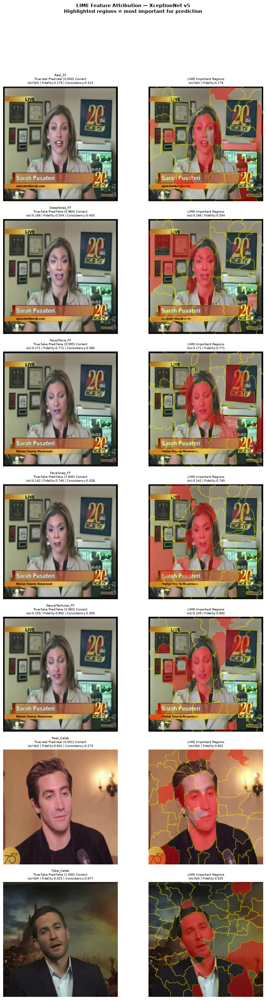

Saved: C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results\lime\lime_summary_final.png


In [12]:
#LIME visualisation
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries

fig, axes = plt.subplots(len(sample_folders), 2, figsize=(10, 4.5*len(sample_folders)))
fig.suptitle('LIME Feature Attribution — XceptionNet v5\nHighlighted regions = most important for prediction',
             fontsize=11, fontweight='bold', y=1.01)

for row, category in enumerate(sample_folders.keys()):
    r = next(x for x in lime_results if x['category'] == category)
    status = 'Correct' if r['correct'] else 'Incorrect'
    #localisation
    iou_str = f"{r['localisation_iou']:.3f}" if not np.isnan(r['localisation_iou']) else "N/A"

    #consistency
    repro_str = (
        f"{r['consistency']:.3f}"
        if not np.isnan(r['consistency'])
        else "N/A"
    )
    axes[row,0].imshow(r['image_display'])
    axes[row, 0].set_title(
        f"{category}\n"
        f"True:{r['true_label']} "
        f"Pred:{r['predicted_label']} "
        f"({r['prediction']:.3f}) {status}\n"
        f"IoU:{iou_str} | "
        f"Fidelity:{r['fidelity']:.3f} | "
        f"Consistency:{repro_str}",
        fontsize=7
    )
    axes[row,0].axis('off')

    boundary_img = mark_boundaries(r['image_display'], r['segments'])
    highlighted = boundary_img.copy()
    highlighted[r['top_mask']] = [1, 0, 0]  # important region red

    overlay = 0.6*r['image_display'] + 0.4*highlighted
    axes[row,1].imshow(overlay)
    axes[row,1].set_title(f"LIME Important Regions\nIoU:{iou_str} | Fidelity:{r['fidelity']:.3f}", fontsize=7)
    axes[row,1].axis('off')

plt.tight_layout(rect=[0,0,1,0.96])
save_path = f'{RESULTS_DIR}\\lime\\lime_summary_final.png'
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print(f"Saved: {save_path}")

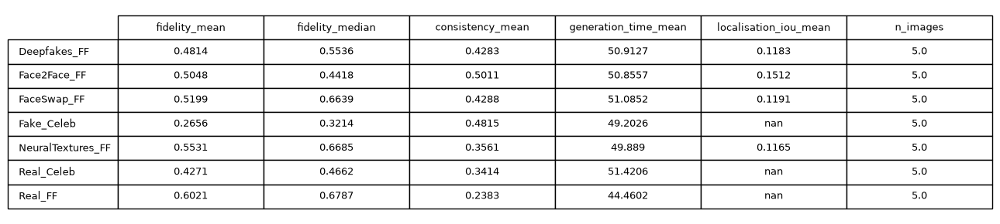

In [13]:
#LIME summary table
import pandas as pd
import matplotlib.pyplot as plt
summary_from_csv = pd.read_csv(
    f'{RESULTS_DIR}\\lime\\lime_category_summary_final.csv',
    index_col='category'
)
summary_from_csv = summary_from_csv.rename(columns={'consistency_mean': 'consistency_mean'})

fig, ax = plt.subplots(figsize=(13, 3))
ax.axis('off')

tbl = ax.table(
    cellText=summary_from_csv.round(5).values,
    colLabels=summary_from_csv.round(5).columns,
    rowLabels=summary_from_csv.round(5).index,
    cellLoc='center',
    loc='center'
)
tbl.auto_set_font_size(False)
tbl.set_fontsize(9)
tbl.scale(1, 1.6)

plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}\\lime\\lime_summary_table_final.png', dpi=200, bbox_inches='tight')
plt.show()

In [18]:
#LIME vs SHAP
import pandas as pd
mask_categories = ['Deepfakes_FF', 'Face2Face_FF', 'FaceSwap_FF', 'NeuralTextures_FF']

shap_summary = df_shap.groupby('category').agg(
    mean_abs_shap_mean=('mean_abs_shap','mean'),
    fidelity_mean=('fidelity','mean'),
    fidelity_median=('fidelity','median'),
    consistency_mean=('consistency','mean'),
    generation_time_mean=('generation_time','mean'),
    localisation_iou_mean=('localisation_iou','mean'),
    n_images=('filename','count'),
).round(5)

lime_summary = df_lime.groupby('category').agg(
    fidelity_mean=('fidelity','mean'),
    fidelity_median=('fidelity','median'),
    consistency_mean=('consistency','mean'),
    generation_time_mean=('generation_time','mean'),
    localisation_iou_mean=('localisation_iou','mean'),
    n_images=('filename','count'),
).round(5)

shap_fidelity_range = f"{df_shap['fidelity'].mean():.3f} ({df_shap['fidelity'].min():.3f}–{df_shap['fidelity'].max():.3f})"
lime_fidelity_range = f"{df_lime['fidelity'].mean():.3f} ({df_lime['fidelity'].min():.3f}–{df_lime['fidelity'].max():.3f})"
shap_consistency_range = f"{df_shap['consistency'].mean():.3f} ({df_shap['consistency'].min():.3f}–{df_shap['consistency'].max():.3f})"
lime_consistency_range = f"{df_lime['consistency'].mean():.3f} ({df_lime['consistency'].min():.3f}–{df_lime['consistency'].max():.3f})"

shap_iou_avg = shap_summary.loc[mask_categories, 'localisation_iou_mean'].mean()
lime_iou_avg = lime_summary.loc[mask_categories, 'localisation_iou_mean'].mean()

comparison = pd.DataFrame({
    'SHAP': [
        shap_fidelity_range,
        f"{shap_iou_avg:.3f}",
        shap_consistency_range,
        f"{shap_summary['generation_time_mean'].mean():.1f}",
    ],
    'LIME': [
        lime_fidelity_range,
        f"{lime_iou_avg:.3f}",
        lime_consistency_range,
        f"{lime_summary['generation_time_mean'].mean():.1f}",
    ]
}, index=[
    'Fidelity, mean (range)',
    'Localisation IoU (4 manipulation categories, mean)',
    'Consistency, mean (range)',
    'Generation time (s, mean)'
])

print(comparison)

                                                                   SHAP  \
Fidelity, mean (range)                              0.459 (0.001–0.902)   
Localisation IoU (4 manipulation categories, mean)                0.092   
Consistency, mean (range)                           0.948 (0.853–0.990)   
Generation time (s, mean)                                         162.6   

                                                                   LIME  
Fidelity, mean (range)                              0.479 (0.005–0.892)  
Localisation IoU (4 manipulation categories, mean)                0.126  
Consistency, mean (range)                           0.397 (0.092–0.677)  
Generation time (s, mean)                                          49.7  


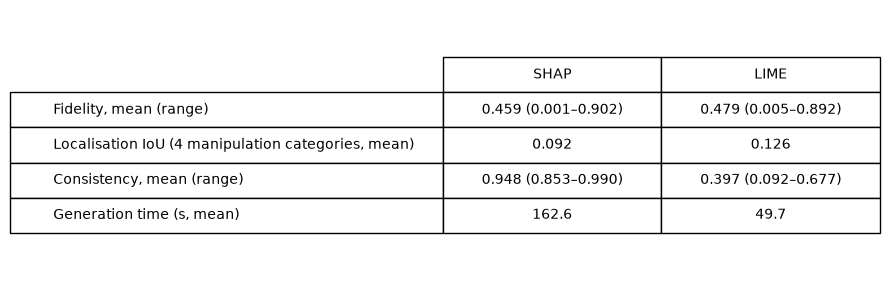

Saved: C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results\shap_vs_lime_comparison_table_final.png


In [19]:
#Save as table image 
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(9, 3))
ax.axis('off')
tbl = ax.table(
    cellText=comparison.values,
    colLabels=comparison.columns,
    rowLabels=comparison.index,
    cellLoc='center',
    loc='center'
)
tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1, 1.8)

for (row, col), cell in tbl.get_celld().items():
    if col == -1:
        cell.set_width(0.32)

plt.tight_layout()
save_path = f'{RESULTS_DIR}\\shap_vs_lime_comparison_table_final.png'
plt.savefig(save_path, dpi=200, bbox_inches='tight')
plt.show()
print(f"Saved: {save_path}")

In [17]:
misclassified_lime = [r for r in lime_results if not r['correct']]
print(f"{len(misclassified_lime)} misclassified images (LIME)")
for r in misclassified_lime:
    print(f"  {r['category']}/{r['filename']}: true={r['true_label']}, pred={r['predicted_label']} ({r['prediction']:.3f})")

2 misclassified images (LIME)
  Real_Celeb/id25_0003_f07.jpg: true=real, pred=fake (0.997)
  Real_Celeb/id32_0006_f07.jpg: true=real, pred=fake (0.958)


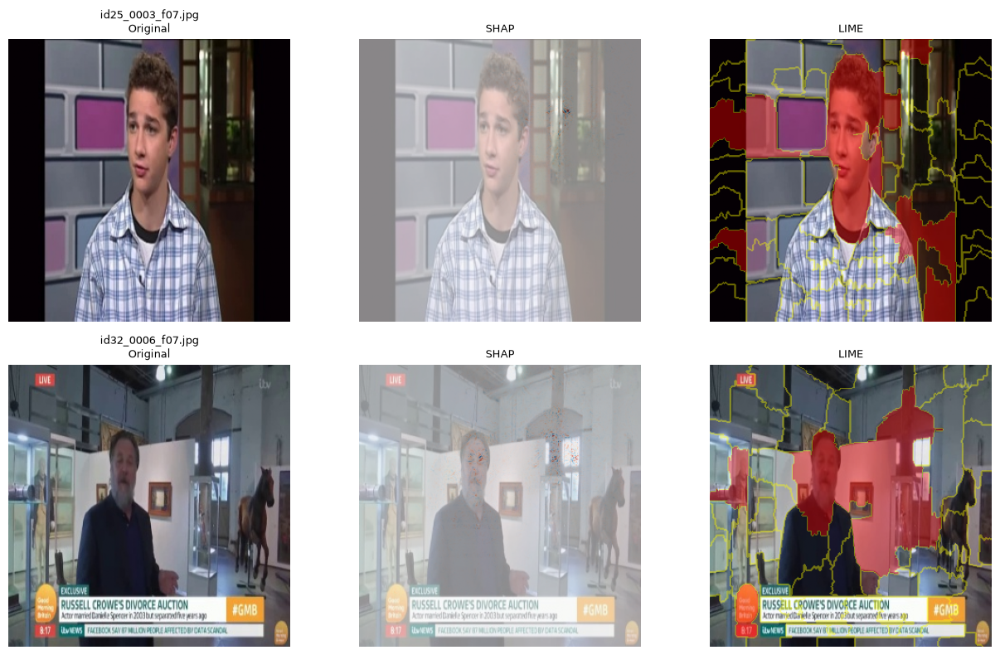

In [20]:
#misclassified images - SHAP vs LIME
misclassified_files = ['id25_0003_f07.jpg', 'id32_0006_f07.jpg']

fig, axes = plt.subplots(2, 3, figsize=(13, 8))

for row, fname in enumerate(misclassified_files):
    shap_r = next(r for r in raw_results if r['filename'] == fname)
    lime_r = next(r for r in lime_results if r['filename'] == fname)

    axes[row,0].imshow(shap_r['image_display'])
    axes[row,0].set_title(f"{fname}\nOriginal", fontsize=9)
    axes[row,0].axis('off')

    signed = shap_r['signed_map']
    max_abs = max(abs(signed.min()), abs(signed.max())) + 1e-8
    axes[row,1].imshow(shap_r['image_display'])
    axes[row,1].imshow(signed, cmap='RdBu_r', alpha=0.55, vmin=-max_abs, vmax=max_abs)
    axes[row,1].set_title("SHAP", fontsize=9)
    axes[row,1].axis('off')

    from skimage.segmentation import mark_boundaries
    highlighted = mark_boundaries(lime_r['image_display'], lime_r['segments']).copy()
    highlighted[lime_r['top_mask']] = [1,0,0]
    overlay = 0.6*lime_r['image_display'] + 0.4*highlighted
    axes[row,2].imshow(overlay)
    axes[row,2].set_title("LIME", fontsize=9)
    axes[row,2].axis('off')

plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}\\misclassified_shap_vs_lime.png', dpi=150, bbox_inches='tight')
plt.show()

In [61]:
#versions
import shap, lime, sys, torch
print("Python:", sys.version)
print("PyTorch:", torch.__version__)
print("SHAP:", shap.__version__)
print("LIME:", lime.__version__)

Python: 3.11.9 (tags/v3.11.9:de54cf5, Apr  2 2024, 10:12:12) [MSC v.1938 64 bit (AMD64)]
PyTorch: 2.5.1+cu121
SHAP: 0.51.0


AttributeError: module 'lime' has no attribute '__version__'

In [62]:
import subprocess
result = subprocess.run(['pip', 'show', 'lime'], capture_output=True, text=True)
print(result.stdout)

Name: lime
Version: 0.2.0.1
Summary: Local Interpretable Model-Agnostic Explanations for machine learning classifiers
Home-page: http://github.com/marcotcr/lime
Author: Marco Tulio Ribeiro
Author-email: marcotcr@gmail.com
License: BSD
Location: C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\.venv\Lib\site-packages
Requires: matplotlib, numpy, scikit-image, scikit-learn, scipy, tqdm
Required-by: 



In [22]:
print(shap_summary['consistency_mean'])
print(lime_summary['consistency_mean'])

category
Deepfakes_FF         0.92019
Face2Face_FF         0.94409
FaceSwap_FF          0.94400
Fake_Celeb           0.95168
NeuralTextures_FF    0.96073
Real_Celeb           0.97168
Real_FF              0.94615
Name: consistency_mean, dtype: float64
category
Deepfakes_FF         0.42831
Face2Face_FF         0.50110
FaceSwap_FF          0.42883
Fake_Celeb           0.48149
NeuralTextures_FF    0.35612
Real_Celeb           0.34136
Real_FF              0.23831
Name: consistency_mean, dtype: float64


                   SHAP Correlation SHAP Assessment  LIME IoU (42 vs 123)  \
Deepfakes_FF                0.92019            High               0.42831   
Face2Face_FF                0.94409            High               0.50110   
FaceSwap_FF                 0.94400            High               0.42883   
Fake_Celeb                  0.95168            High               0.48149   
NeuralTextures_FF           0.96073            High               0.35612   
Real_Celeb                  0.97168            High               0.34136   
Real_FF                     0.94615            High               0.23831   
Mean                        0.94836            High               0.39650   

                  LIME Assessment  
Deepfakes_FF               Medium  
Face2Face_FF               Medium  
FaceSwap_FF                Medium  
Fake_Celeb                 Medium  
NeuralTextures_FF             Low  
Real_Celeb                    Low  
Real_FF                       Low  
Mean              

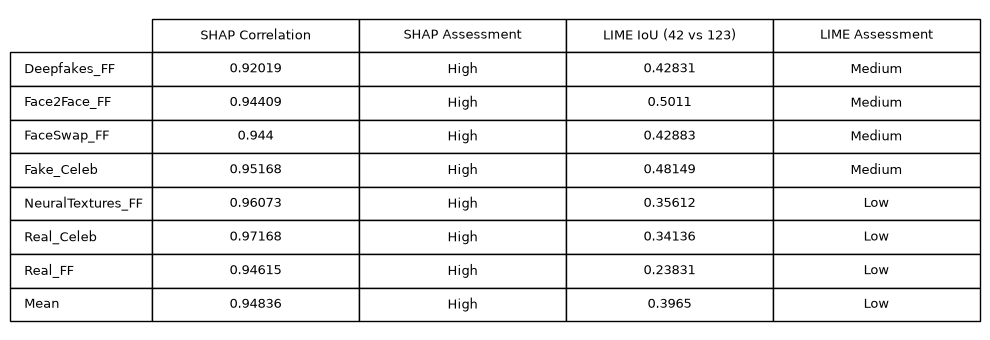

In [25]:
#Consistency table SHAP and LIME
import pandas as pd

shap_consistency = shap_summary['consistency_mean']
lime_consistency = lime_summary['consistency_mean']

def assess(val, thresholds=(0.7, 0.4)):
    if val >= thresholds[0]:
        return 'High'
    elif val >= thresholds[1]:
        return 'Medium'
    else:
        return 'Low'

table_4_7 = pd.DataFrame({
    'SHAP Correlation': shap_consistency.round(5),
    'SHAP Assessment': shap_consistency.apply(assess),
    'LIME IoU (42 vs 123)': lime_consistency.round(5),
    'LIME Assessment': lime_consistency.apply(assess),
})

mean_row = pd.DataFrame({
    'SHAP Correlation': [shap_consistency.mean().round(5)],
    'SHAP Assessment': [assess(shap_consistency.mean())],
    'LIME IoU (42 vs 123)': [lime_consistency.mean().round(5)],
    'LIME Assessment': [assess(lime_consistency.mean())],
}, index=['Mean'])

table_4_7 = pd.concat([table_4_7, mean_row])

table_4_7.to_csv(f'{RESULTS_DIR}\\table_4_7_consistency_final.csv')
print(table_4_7)
fig, ax = plt.subplots(figsize=(10, 3.5))
ax.axis('off')
tbl = ax.table(cellText=table_4_7.values, colLabels=table_4_7.columns,
                rowLabels=table_4_7.index, cellLoc='center', loc='center')
tbl.auto_set_font_size(False)
tbl.set_fontsize(9)
tbl.scale(1, 1.7)
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}\\table_4_7_consistency_final.png', dpi=200, bbox_inches='tight')
plt.show()

=== Localisation IoU — Deepfakes FF++ ===

          Image  SHAP IoU SHAP Quality  LIME IoU LIME Quality
438_434_f07.jpg    0.0909          Low    0.1660          Low
942_943_f07.jpg    0.1103          Low    0.1242          Low
779_794_f07.jpg    0.0333          Low    0.0598          Low
943_942_f07.jpg    0.0913          Low    0.1194          Low
529_633_f07.jpg    0.0649          Low    0.1220          Low
           Mean    0.0781          Low    0.1183          Low


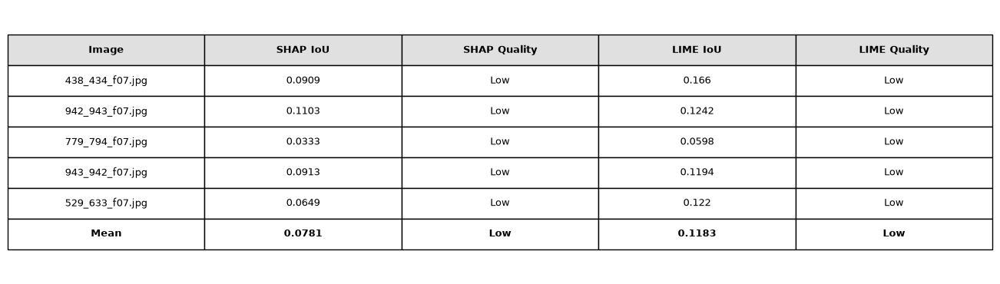

Saved


In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Localisation table 

def quality(iou):
    if iou >= 0.5:
        return 'High'
    elif iou >= 0.3:
        return 'Medium'
    else:
        return 'Low'

deepfakes_shap = df_shap[
    df_shap['category'] == 'Deepfakes_FF'
][['filename', 'localisation_iou']].copy()

deepfakes_lime = df_lime[
    df_lime['category'] == 'Deepfakes_FF'
][['filename', 'localisation_iou']].copy()

table_loc = deepfakes_shap.merge(
    deepfakes_lime,
    on='filename',
    suffixes=('_SHAP', '_LIME')
)
table_loc.columns = ['Image', 'SHAP IoU', 'LIME IoU']
table_loc = table_loc.round(4)

table_loc.insert(2, 'SHAP Quality',
    table_loc['SHAP IoU'].apply(quality))
table_loc.insert(4, 'LIME Quality',
    table_loc['LIME IoU'].apply(quality))

#  mean row
mean_shap = table_loc['SHAP IoU'].mean().round(4)
mean_lime = table_loc['LIME IoU'].mean().round(4)

mean_row = pd.DataFrame([{
    'Image':        'Mean',
    'SHAP IoU':     mean_shap,
    'SHAP Quality': quality(mean_shap),
    'LIME IoU':     mean_lime,
    'LIME Quality': quality(mean_lime),
}])

table_loc = pd.concat(
    [table_loc, mean_row], ignore_index=True)

print("=== Localisation IoU — Deepfakes FF++ ===\n")
print(table_loc.to_string(index=False))

fig, ax = plt.subplots(figsize=(13, 3.8))
ax.axis('off')

table = ax.table(
    cellText=table_loc.values,
    colLabels=table_loc.columns,
    cellLoc='center',
    loc='center'
)

table.auto_set_font_size(False)
table.set_fontsize(9.5)
table.scale(1.2, 2.0)
for j in range(len(table_loc.columns)):
    table[0, j].set_facecolor('#E0E0E0')
    table[0, j].set_text_props(fontweight='bold')

for j in range(len(table_loc.columns)):
    table[len(table_loc), j].set_text_props(
        fontweight='bold')

plt.tight_layout()

RESULTS_DIR = (r"C:\Users\aditi\Desktop\Warwick\Modules"
               r"\Dissertation\JupyterProject\results")

plt.savefig(
    f'{RESULTS_DIR}\\localisation_iou_table_Final.png',
    dpi=200, bbox_inches='tight')
plt.show()
print("Saved", flush=True)

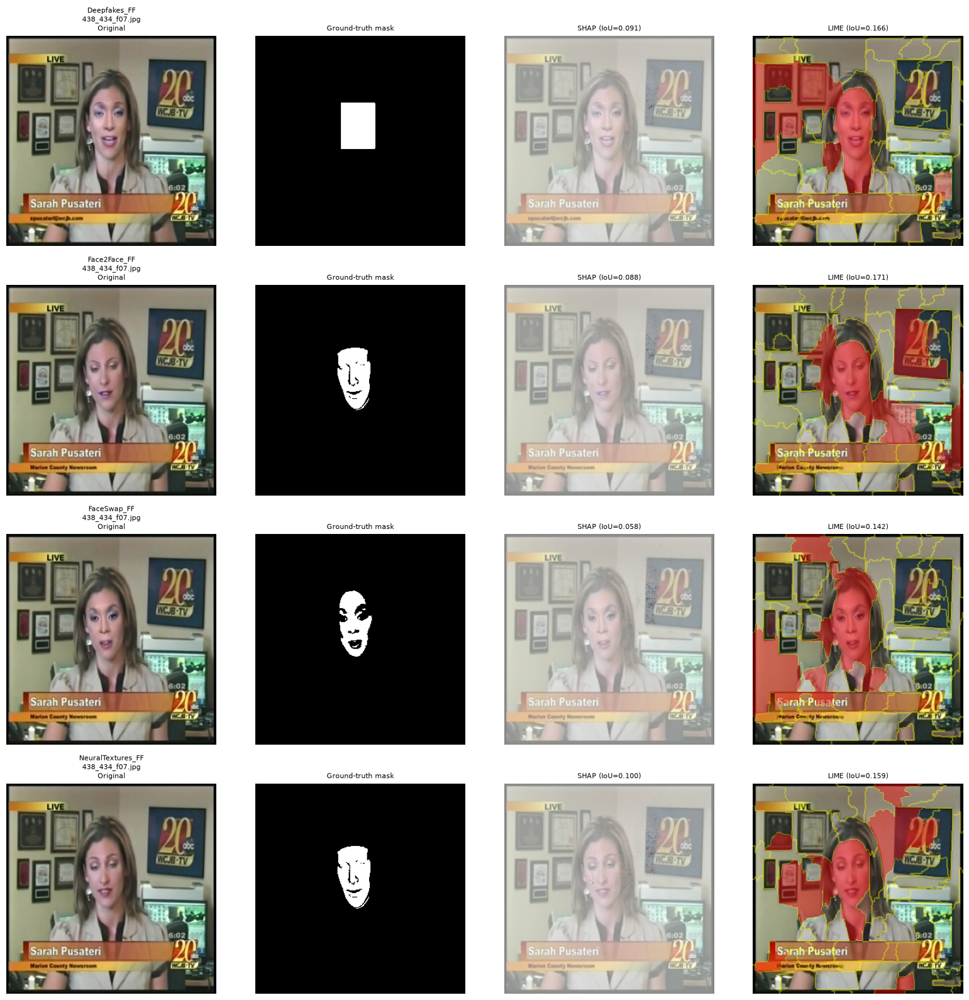

In [63]:
#ground truth manipulation masks
mask_categories = ['Deepfakes_FF', 'Face2Face_FF', 'FaceSwap_FF', 'NeuralTextures_FF']

fig, axes = plt.subplots(len(mask_categories), 4, figsize=(16, 4*len(mask_categories)))

for row, category in enumerate(mask_categories):
    shap_r = next(r for r in raw_results if r['category'] == category)
    lime_r = next(r for r in lime_results if r['category'] == category and r['filename'] == shap_r['filename'])

    fname = shap_r['filename']

    axes[row,0].imshow(shap_r['image_display'])
    axes[row,0].set_title(f"{category}\n{fname}\nOriginal", fontsize=8)
    axes[row,0].axis('off')

    mask_path = os.path.join(mask_folders[category], fname.replace('.jpg', '.png'))
    gt_mask = load_mask(mask_path)
    axes[row,1].imshow(gt_mask, cmap='gray')
    axes[row,1].set_title("Ground-truth mask", fontsize=8)
    axes[row,1].axis('off')

    signed = shap_r['signed_map']
    max_abs = max(abs(signed.min()), abs(signed.max())) + 1e-8
    axes[row,2].imshow(shap_r['image_display'])
    axes[row,2].imshow(signed, cmap='RdBu_r', alpha=0.55, vmin=-max_abs, vmax=max_abs)
    axes[row,2].set_title(f"SHAP (IoU={shap_r['localisation_iou']:.3f})", fontsize=8)
    axes[row,2].axis('off')

    highlighted = mark_boundaries(lime_r['image_display'], lime_r['segments']).copy()
    highlighted[lime_r['top_mask']] = [1,0,0]
    overlay = 0.6*lime_r['image_display'] + 0.4*highlighted
    axes[row,3].imshow(overlay)
    axes[row,3].set_title(f"LIME (IoU={lime_r['localisation_iou']:.3f})", fontsize=8)
    axes[row,3].axis('off')

plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}\\figure_4_9_localisation_all4categories_final.png', dpi=150, bbox_inches='tight')
plt.show()

                   SHAP Fidelity (drop) SHAP Band  LIME Fidelity (drop)  \
Deepfakes_FF                      0.401    Medium                 0.481   
Face2Face_FF                      0.627      High                 0.505   
FaceSwap_FF                       0.578      High                 0.520   
Fake_Celeb                        0.490    Medium                 0.266   
NeuralTextures_FF                 0.648      High                 0.553   
Real_Celeb                        0.283    Medium                 0.427   
Real_FF                           0.186       Low                 0.602   
Mean                              0.459    Medium                 0.479   

                  LIME Band  
Deepfakes_FF         Medium  
Face2Face_FF           High  
FaceSwap_FF            High  
Fake_Celeb           Medium  
NeuralTextures_FF      High  
Real_Celeb           Medium  
Real_FF                High  
Mean                 Medium  


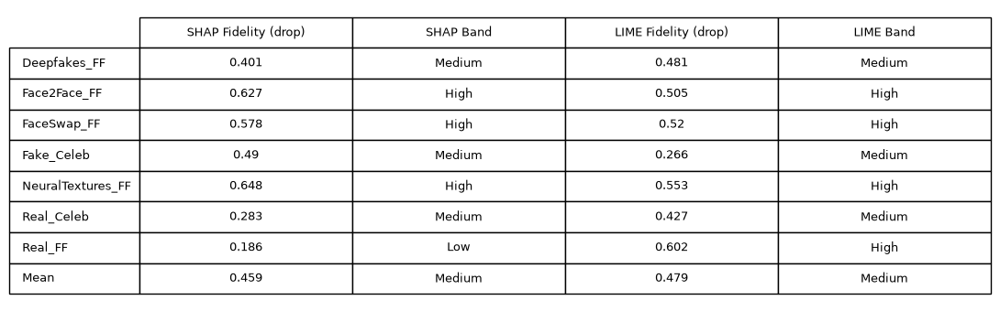

In [65]:
#fidelity 
def fidelity_band(val):
    if val >= 0.5:
        return 'High'
    elif val >= 0.25:
        return 'Medium'
    else:
        return 'Low'

table_4_10 = pd.DataFrame({
    'SHAP Fidelity (drop)': shap_summary['fidelity_mean'].round(3),
    'SHAP Band': shap_summary['fidelity_mean'].apply(fidelity_band),
    'LIME Fidelity (drop)': lime_summary['fidelity_mean'].round(3),
    'LIME Band': lime_summary['fidelity_mean'].apply(fidelity_band),
})
mean_row = pd.DataFrame({
    'SHAP Fidelity (drop)': [shap_summary['fidelity_mean'].mean().round(3)],
    'SHAP Band': [fidelity_band(shap_summary['fidelity_mean'].mean())],
    'LIME Fidelity (drop)': [lime_summary['fidelity_mean'].mean().round(3)],
    'LIME Band': [fidelity_band(lime_summary['fidelity_mean'].mean())],
}, index=['Mean'])
table_4_10 = pd.concat([table_4_10, mean_row])
print(table_4_10)

fig, ax = plt.subplots(figsize=(11, 3.5))
ax.axis('off')
tbl = ax.table(cellText=table_4_10.values, colLabels=table_4_10.columns,
                rowLabels=table_4_10.index, cellLoc='center', loc='center')
tbl.auto_set_font_size(False)
tbl.set_fontsize(9)
tbl.scale(1, 1.7)
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}\\table_4_10_fidelity_final.png', dpi=200, bbox_inches='tight')
plt.show()

                          FSR Code      SHAP Score      LIME Score  \
Transparency               s22.2.3      Low-Medium            High   
Consistency                s24.9.9    0.948 (High)     0.397 (Low)   
Localisation               s73.3.2    0.092 (Poor)    0.126 (Poor)   
Reproducibility     s19.2.3/ s3.18            Pass            Pass   
Fidelity         s24.1.1 - s24.2.2  0.459 (Medium)  0.479 (Medium)   

                Better Tool             FSR Met or Not  
Transparency           LIME                    Partial  
Consistency            SHAP  SHAP: Yes / LIME: Partial  
Localisation        Neither                         No  
Reproducibility       Equal                  Both: Yes  
Fidelity               LIME          Both: Partial-Yes  


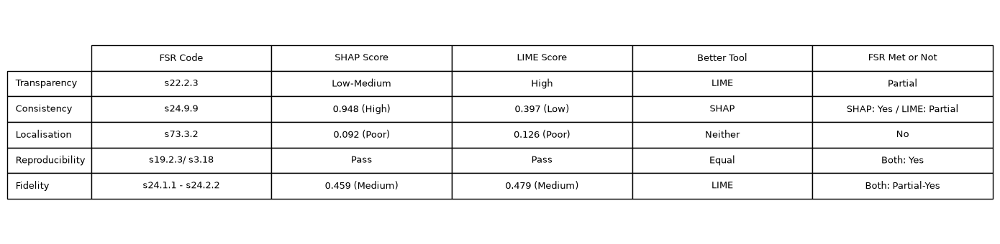

In [24]:
#SHAP vs LIME with framework 
import pandas as pd
import matplotlib.pyplot as plt

RESULTS_DIR = r"C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results"

shap_consistency_mean = shap_summary['consistency_mean'].mean()
lime_consistency_mean = lime_summary['consistency_mean'].mean()

mask_categories = ['Deepfakes_FF', 'Face2Face_FF', 'FaceSwap_FF', 'NeuralTextures_FF']
shap_iou_mean = shap_summary.loc[mask_categories, 'localisation_iou_mean'].mean()
lime_iou_mean = lime_summary.loc[mask_categories, 'localisation_iou_mean'].mean()

shap_fidelity_mean = shap_summary['fidelity_mean'].mean()
lime_fidelity_mean = lime_summary['fidelity_mean'].mean()

def band(val, high=0.7, low=0.4):
    if val >= high: return 'High'
    elif val >= low: return 'Medium'
    else: return 'Low'

def fid_band(val, high=0.5, low=0.25):
    if val >= high: return 'High'
    elif val >= low: return 'Medium'
    else: return 'Low'

def iou_band(val, good=0.5, mod=0.2):
    if val >= good: return 'Good'
    elif val >= mod: return 'Medium'
    else: return 'Poor'

table_4_11 = pd.DataFrame({
    'FSR Code': ['s22.2.3', 's24.9.9', 's73.3.2', 's19.2.3/ s3.18', 's24.1.1 - s24.2.2'],
    'SHAP Score': [
        'Low-Medium',
        f'{shap_consistency_mean:.3f} ({band(shap_consistency_mean)})',
        f'{shap_iou_mean:.3f} ({iou_band(shap_iou_mean)})',
        'Pass',
        f'{shap_fidelity_mean:.3f} ({fid_band(shap_fidelity_mean)})',
    ],
    'LIME Score': [
        'High',
        f'{lime_consistency_mean:.3f} ({band(lime_consistency_mean)})',
        f'{lime_iou_mean:.3f} ({iou_band(lime_iou_mean)})',
        'Pass',
        f'{lime_fidelity_mean:.3f} ({fid_band(lime_fidelity_mean)})',
    ],
    'Better Tool': ['LIME', 'SHAP', 'Neither', 'Equal', 'LIME' if lime_fidelity_mean > shap_fidelity_mean else 'SHAP'],
    'FSR Met or Not': ['Partial', 'SHAP: Yes / LIME: Partial', 'No', 'Both: Yes', 'Both: Partial-Yes'],
}, index=['Transparency', 'Consistency', 'Localisation', 'Reproducibility', 'Fidelity'])

print(table_4_11)

fig, ax = plt.subplots(figsize=(14, 3.5))
ax.axis('off')
tbl = ax.table(cellText=table_4_11.values, colLabels=table_4_11.columns,
                rowLabels=table_4_11.index, cellLoc='center', loc='center')
tbl.auto_set_font_size(False)
tbl.set_fontsize(9)
tbl.scale(1, 1.8)
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}\\table_framework_final.png', dpi=200, bbox_inches='tight')
plt.show()

           Overall (weighted)   Real   Fake
Accuracy                0.720    NaN    NaN
Precision               0.692  0.516  0.763
Recall                  0.720  0.313  0.883
F1-score                0.696  0.390  0.818


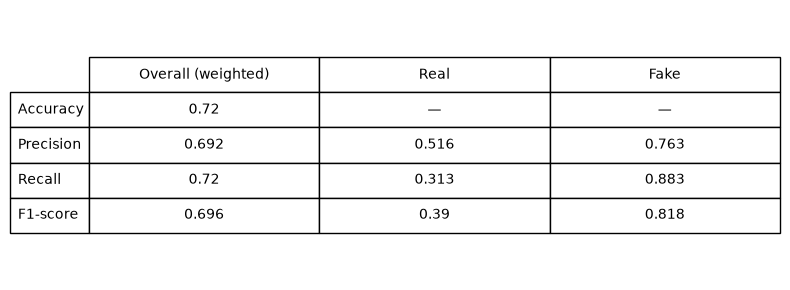

In [10]:
#overall xceptionnet model
from sklearn.metrics import accuracy_score, classification_report
import pandas as pd
import matplotlib.pyplot as plt

overall_acc = accuracy_score(all_labels, all_preds)

report = classification_report(all_labels, all_preds, target_names=['Real', 'Fake'], output_dict=True)

metrics_table = pd.DataFrame({
    'Overall (weighted)': [
        overall_acc,
        report['weighted avg']['precision'],
        report['weighted avg']['recall'],
        report['weighted avg']['f1-score'],
    ],
    'Real': [
        None,
        report['Real']['precision'],
        report['Real']['recall'],
        report['Real']['f1-score'],
    ],
    'Fake': [
        None,
        report['Fake']['precision'],
        report['Fake']['recall'],
        report['Fake']['f1-score'],
    ],
}, index=['Accuracy', 'Precision', 'Recall', 'F1-score']).round(3)

print(metrics_table)

fig, ax = plt.subplots(figsize=(8, 3))
ax.axis('off')
tbl = ax.table(cellText=metrics_table.fillna('—').values, colLabels=metrics_table.columns,
                rowLabels=metrics_table.index, cellLoc='center', loc='center')
tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1, 1.8)
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}\\model_xceptionmetrics_table_final.png', dpi=200, bbox_inches='tight')
plt.show()

In [57]:
misclassified = [r for r in raw_results if not r['correct']]
print(f"{len(misclassified)} misclassified images out of {len(raw_results)}")
for r in misclassified:
    print(f"  {r['category']}/{r['filename']}: true={r['true_label']}, pred={r['predicted_label']} ({r['prediction']:.3f})")

2 misclassified images out of 35
  Real_Celeb/id25_0003_f07.jpg: true=real, pred=fake (0.997)
  Real_Celeb/id32_0006_f07.jpg: true=real, pred=fake (0.958)


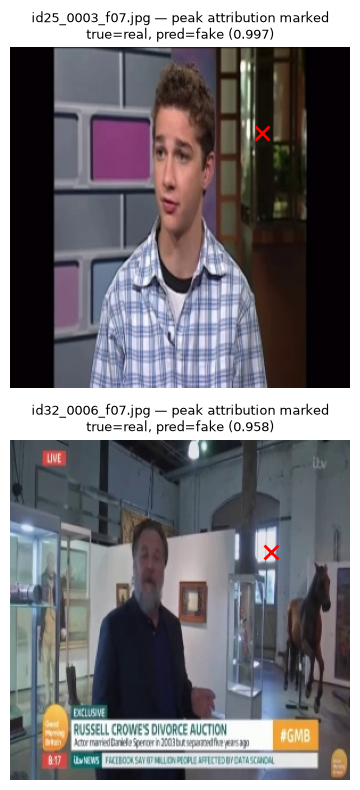

Saved: C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results\shap\misclassified_celeb_peak_attribution_final.png


In [23]:
import matplotlib.pyplot as plt
import numpy as np

misclassified = [r for r in raw_results if not r['correct']]

fig, axes = plt.subplots(len(misclassified), 1, figsize=(4, 4*len(misclassified)))
if len(misclassified) == 1:
    axes = [axes]

for ax, r in zip(axes, misclassified):
    signed = r['signed_map']
    peak_y, peak_x = np.unravel_index(np.argmax(np.abs(signed)), signed.shape)

    ax.imshow(r['image_display'])
    ax.scatter([peak_x], [peak_y], color='red', s=100, marker='x', linewidths=2)
    ax.set_title(f"{r['filename']} — peak attribution marked\n"
                 f"true={r['true_label']}, pred={r['predicted_label']} ({r['prediction']:.3f})",
                 fontsize=9)
    ax.axis('off')

plt.tight_layout()
save_path = f'{RESULTS_DIR}\\shap\\misclassified_celeb_peak_attribution_final.png'
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print(f"Saved: {save_path}")

In [60]:
for r in lime_results:
    if r['category'] == 'Real_Celeb' and r['filename'] in ['id25_0003_f07.jpg', 'id32_0006_f07.jpg']:
        print(f"{r['filename']}: true={r['true_label']}, pred={r['predicted_label']} ({r['prediction']:.3f}), correct={r['correct']}")

id25_0003_f07.jpg: true=real, pred=fake (0.997), correct=False
id32_0006_f07.jpg: true=real, pred=fake (0.958), correct=False


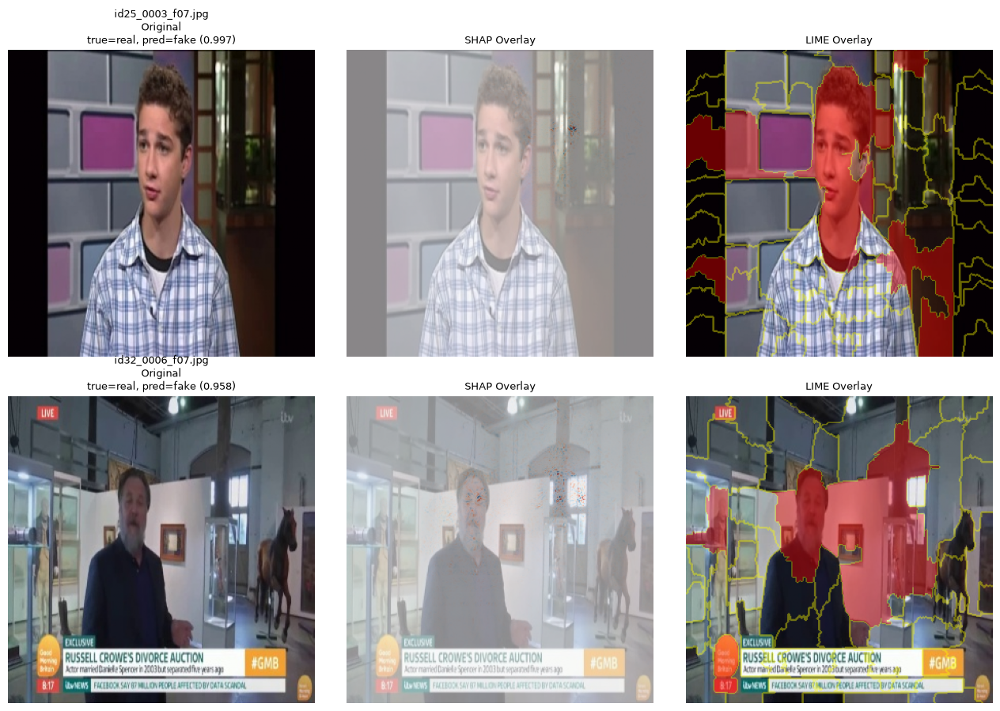

Saved: C:\Users\aditi\Desktop\Warwick\Modules\Dissertation\JupyterProject\results\misclassified_shap_vs_lime_final.png


In [61]:
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries
import numpy as np

target_files = ['id25_0003_f07.jpg', 'id32_0006_f07.jpg']

fig, axes = plt.subplots(len(target_files), 3, figsize=(13, 4.5*len(target_files)))

for row, fname in enumerate(target_files):
    shap_r = next(r for r in raw_results if r['filename'] == fname and r['category'] == 'Real_Celeb')
    lime_r = next(r for r in lime_results if r['filename'] == fname and r['category'] == 'Real_Celeb')

    axes[row,0].imshow(shap_r['image_display'])
    axes[row,0].set_title(f"{fname}\nOriginal\ntrue={shap_r['true_label']}, pred={shap_r['predicted_label']} ({shap_r['prediction']:.3f})", fontsize=9)
    axes[row,0].axis('off')

    signed = shap_r['signed_map']
    max_abs = max(abs(signed.min()), abs(signed.max())) + 1e-8
    axes[row,1].imshow(shap_r['image_display'])
    axes[row,1].imshow(signed, cmap='RdBu_r', alpha=0.55, vmin=-max_abs, vmax=max_abs)
    axes[row,1].set_title("SHAP Overlay", fontsize=9)
    axes[row,1].axis('off')

    highlighted = mark_boundaries(lime_r['image_display'], lime_r['segments']).copy()
    highlighted[lime_r['top_mask']] = [1,0,0]
    lime_overlay = 0.6*lime_r['image_display'] + 0.4*highlighted
    axes[row,2].imshow(lime_overlay)
    axes[row,2].set_title("LIME Overlay", fontsize=9)
    axes[row,2].axis('off')

plt.tight_layout()
save_path = f'{RESULTS_DIR}\\misclassified_shap_vs_lime_final.png'
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print(f"Saved: {save_path}")

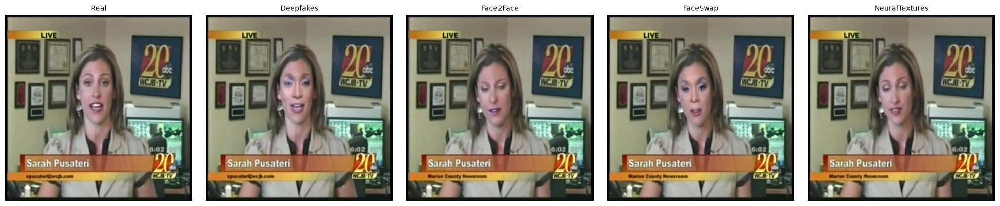

In [3]:
import matplotlib.pyplot as plt

ff_categories = ['Real_FF', 'Deepfakes_FF', 'Face2Face_FF', 'FaceSwap_FF', 'NeuralTextures_FF']

fig, axes = plt.subplots(1, len(ff_categories), figsize=(4*len(ff_categories), 4))
for ax, cat in zip(axes, ff_categories):
    r = next(x for x in raw_results if x['category'] == cat)
    ax.imshow(r['image_display'])
    ax.set_title(cat.replace('_FF', ''), fontsize=10)
    ax.axis('off')
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}\\faceforensics_sample_images.png', dpi=150, bbox_inches='tight')
plt.show()

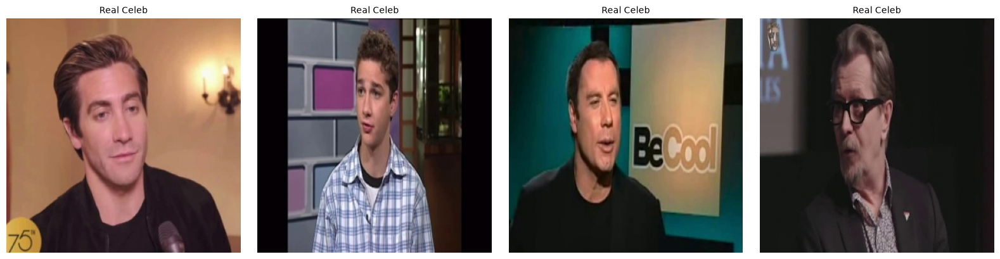

In [4]:
celeb_categories = ['Real_Celeb', 'Fake_Celeb']
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
celeb_images = [r for r in raw_results if r['category'] in celeb_categories][:4]
for ax, r in zip(axes, celeb_images):
    ax.imshow(r['image_display'])
    ax.set_title(r['category'].replace('_', ' '), fontsize=10)
    ax.axis('off')
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}\\celebdf_sample_images.png', dpi=150, bbox_inches='tight')
plt.show()